**By Edwin Tembo, Masters Candidate, Harvard Extension School , ALM, Data Science, December-2025.**

This notebook is one of many used as part of our Data Science Capstone Project for the Harvard Extension School's Data Science Masters Degree Program (ALM).

We explore how the results of LLM Based Sentiment Analysis can be post-processed for downstream tasks, such as feature engineering, feature selection and model training.

AI Usage Notice :

AI was used to generate some starter code, for code review and formatting (PEP-8).

In [ ]:
# Install LangChain and dependencies
!pip install -q langchain==0.3.27 langchain-community==0.3.31 langchain-openai==0.3.35 langchain-huggingface==0.3.1
!pip install -q accelerate==1.12.0
!pip install -q tqdm==4.67.1 mlflow[auth]==3.2.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 450.8/450.8 kB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.7/64.7 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 2.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.32.5 which is incompatible.
langgraph-prebuilt 1.0.5 requires langchain-core>=1.0.0, but you have langchain-core 0.3.80 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 710.4 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 63.6 MB

# OPENAI Direct

### Research Context

- According to [Swanson (2021)](https://sites.socsci.uci.edu/~swanson2/papers/ifcs.pdf), speeches and testimony by FED chairs, in addition to Post-FOMC (Federal Open Market Committee) statements, have become more important over time.

- Study by Cleveland Fed on effect of testimony on first and second day of monetary and non-monetary policy: [Economic Commentary](https://www.clevelandfed.org/publications/economic-commentary/2024/ec-202401-effects-of-federal-reserve-chairs-testimony)

In [ ]:
"""
LangChain Agent for Sentiment Analysis with Treasury Knowledge Base.

Compatible with Google Colab, supports both local models and OpenAI API.
"""

import json
import os
import warnings
from datetime import datetime
from functools import lru_cache
from typing import Any, Dict, List, Optional

import pandas as pd
from tqdm import tqdm

warnings.filterwarnings("ignore")

# Google Colab compatibility
try:
    from google.colab import drive, userdata
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

# LangChain imports
from langchain.agents     import AgentExecutor, create_react_agent
from langchain.callbacks  import StdOutCallbackHandler
from langchain.prompts    import PromptTemplate
from langchain.schema     import BaseOutputParser
from langchain.tools      import Tool
from langchain_core.tools import BaseTool
from pydantic import BaseModel, Field

# Model imports (conditionally imported based on configuration)
try:
    from langchain_openai import ChatOpenAI
    OPENAI_AVAILABLE = True
except ImportError:
    OPENAI_AVAILABLE = False

try:
    from langchain_community.chat_models import ChatOllama
    from langchain_community.llms import Ollama
    OLLAMA_AVAILABLE = True
except ImportError:
    OLLAMA_AVAILABLE = False

try:
    import torch
    from langchain_huggingface import HuggingFacePipeline
    from transformers import AutoModelForCausalLM, AutoTokenizer
    HUGGINGFACE_AVAILABLE = True
except ImportError:
    HUGGINGFACE_AVAILABLE = False

In [ ]:
# CONFIGURATION

SENTIMENT_PATH = f"{base_path}"

LIST_OF_FED_CHAIRS = """
Alan Greenspan: Served from 1987 to 2006, so he was chair for the
first six years of the 21st century.
Ben Bernanke: Served from 2006 to 2014.
Janet Yellen: Served from 2014 to 2018.
Jerome Powell: Took office in 2018 and is the current Federal
Reserve Chair.
"""


class ModelConfig:
    """Configuration for different model types."""

    def __init__(self):
        self.model_type = "openai"  # "openai", "ollama", or "huggingface"
        self.model_name = "gpt-5"  # Model identifier
        self.temperature = 0
        self.max_tokens = 64000

        # Paths (Google Colab compatible)
        if IN_COLAB:
            self.sentiment_path = SENTIMENT_PATH
            self.mount_drive()
        else:
            self.sentiment_path = "./data"  # Local path

        # Device selection for local models
        if HUGGINGFACE_AVAILABLE:
            self.device = "cuda" if torch.cuda.is_available() else "cpu"
        else:
            self.device = None

    def mount_drive(self):
        """Mount Google Drive in Colab."""
        if IN_COLAB:
            drive.mount("/content/drive")

    def get_openai_key(self):
        """Get OpenAI API key from Colab secrets or environment."""
        if IN_COLAB:
            try:
                return userdata.get("open_ai")
            except Exception:
                return os.getenv("OPENAI_API_KEY")
        return os.getenv("OPENAI_API_KEY")


config = ModelConfig()

Mounted at /content/drive


In [ ]:
# HELPER FUNCTIONS


@lru_cache(maxsize=None)
def read_text(file_path):
    """Read the content of a text file with caching."""
    try:
        with open(file_path, "r", encoding="utf-8") as f:
            return f.read()
    except FileNotFoundError:
        print(f"Error: File not found at {file_path}")
        return ""
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
        return ""


def get_default_treasury_knowledge():
    """Return fallback knowledge base if file is not available."""
    return """
    US TREASURY MARKET KNOWLEDGE BASE:

    Key Factors Affecting Treasury Prices:
    1. Federal Reserve Policy: Interest rate decisions, QE programs,
       forward guidance
    2. Economic Indicators: Inflation data (CPI, PCE), employment
       reports, GDP growth
    3. Market Sentiment: Risk-on vs risk-off sentiment, flight to
       quality
    4. Geopolitical Events: Wars, trade tensions, political uncertainty
    5. Supply and Demand: Treasury auctions, foreign central bank
       purchases

    Fed Chairs and Their Impact:
    - Alan Greenspan (1987-2006): Known for market-friendly policies
    - Ben Bernanke (2006-2014): Implemented QE programs during
      financial crisis
    - Janet Yellen (2014-2018): Gradual rate normalization
    - Jerome Powell (2018-present): Flexible inflation targeting,
      COVID response

    Market Dynamics:
    - Positive news about economic growth typically pressures Treasury
      prices lower
    - Negative economic news or uncertainty drives flight to quality,
      pushing prices higher
    - Hawkish Fed commentary pressures prices lower; dovish commentary
      supports prices
    """


# Global knowledge base to avoid Pydantic issues
_TREASURY_KNOWLEDGE_BASE = None


def load_treasury_knowledge():
    """Load the Treasury knowledge base from file."""
    global _TREASURY_KNOWLEDGE_BASE

    if _TREASURY_KNOWLEDGE_BASE is not None:
        return _TREASURY_KNOWLEDGE_BASE

    try:
        kb_path = (
            f"{config.sentiment_path}/"
            f"us_treasury_market_playbook_updated.txt"
        )
        with open(kb_path, "r", encoding="utf-8") as f:
            _TREASURY_KNOWLEDGE_BASE = f.read()
            _TREASURY_KNOWLEDGE_BASE += " " + LIST_OF_FED_CHAIRS
            return _TREASURY_KNOWLEDGE_BASE
    except FileNotFoundError:
        print(f"Warning: Treasury knowledge base not found at {kb_path}")
        _TREASURY_KNOWLEDGE_BASE = get_default_treasury_knowledge()
        return _TREASURY_KNOWLEDGE_BASE
    except Exception as e:
        print(f"Error loading knowledge base: {e}")
        _TREASURY_KNOWLEDGE_BASE = get_default_treasury_knowledge()
        return _TREASURY_KNOWLEDGE_BASE

In [ ]:
# TREASURY KNOWLEDGE BASE TOOL


def treasury_knowledge_search(query):
    """Search Treasury knowledge base for relevant information."""
    knowledge_base = load_treasury_knowledge()
    query_lower = query.lower()

    # Simple keyword-based retrieval
    relevant_sections = []
    knowledge_sections = knowledge_base.split("\n\n")

    for section in knowledge_sections:
        if len(section.strip()) > 20:  # Skip very short sections
            keywords = query_lower.split()
            if any(keyword in section.lower() for keyword in keywords):
                relevant_sections.append(section)

    if relevant_sections:
        # Return top 3 relevant sections
        return "\n\n".join(relevant_sections[:3])
    else:
        return f"General Treasury market information: \
{knowledge_base[:1000]}..."


def create_treasury_tool():
    """Create Treasury knowledge tool."""
    description = (
        "Use this tool to get information about US Treasury markets, "
        "Federal Reserve policies, interest rate impacts, bond market "
        "dynamics, and economic indicators that affect Treasury prices. "
        "Provide a specific question or topic you need information about."
    )
    return Tool(
        name="treasury_knowledge",
        description=description,
        func=treasury_knowledge_search
    )

In [ ]:
# MODEL INITIALIZATION


class ModelManager:
    """Manage different model types and initialization."""

    def __init__(self, config_obj):
        self.config = config_obj
        self.llm = None

    def initialize_model(self):
        """Initialize the appropriate model based on configuration."""
        if self.config.model_type == "openai":
            return self._init_openai()
        elif self.config.model_type == "ollama":
            return self._init_ollama()
        elif self.config.model_type == "huggingface":
            return self._init_huggingface()
        else:
            raise ValueError(
                f"Unsupported model type: {self.config.model_type}"
            )

    def _init_openai(self):
        """Initialize OpenAI model."""
        if not OPENAI_AVAILABLE:
            raise ImportError(
                "OpenAI package not available. "
                "Install with: pip install langchain-openai"
            )

        api_key = self.config.get_openai_key()
        if not api_key:
            raise ValueError(
                "OpenAI API key not found. Set OPENAI_API_KEY "
                "environment variable or Colab secret."
            )

        return ChatOpenAI(
            model=self.config.model_name,
            temperature=self.config.temperature,
            max_tokens=self.config.max_tokens,
            openai_api_key=api_key
        )

    def _init_ollama(self):
        """Initialize Ollama model."""
        if not OLLAMA_AVAILABLE:
            raise ImportError(
                "Ollama package not available. "
                "Install with: pip install langchain-community"
            )

        return ChatOllama(
            model=self.config.model_name,
            temperature=self.config.temperature
        )

    def _init_huggingface(self):
        """Initialize HuggingFace model."""
        if not HUGGINGFACE_AVAILABLE:
            raise ImportError(
                "HuggingFace packages not available. "
                "Install transformers and torch."
            )

        tokenizer = AutoTokenizer.from_pretrained(self.config.model_name)

        dtype = (
            torch.float16 if self.config.device == "cuda"
            else torch.float32
        )
        device_map = "auto" if self.config.device == "cuda" else None

        model = AutoModelForCausalLM.from_pretrained(
            self.config.model_name,
            torch_dtype=dtype,
            device_map=device_map
        )

        return HuggingFacePipeline.from_model_id(
            model_id=self.config.model_name,
            task="text-generation",
            model_kwargs={
                "temperature": self.config.temperature,
                "max_length": self.config.max_tokens,
                "device_map": device_map
            }
        )

In [ ]:
# OUTPUT PARSER


class SentimentOutputParser(BaseOutputParser):
    """Parser for sentiment analysis JSON output."""

    def parse(self, text):
        """Parse the model output to extract JSON sentiment analysis."""
        try:
            # Handle parsing error messages that contain the actual JSON
            if "Could not parse LLM output:" in text:
                # Extract JSON from error message
                json_start = text.find("`{")
                json_end = text.find("}`", json_start) + 1
                if json_start != -1 and json_end > json_start:
                    # Remove backticks
                    json_str = text[json_start + 1:json_end]
                    result = json.loads(json_str)

                    # Validate and return
                    required_fields = [
                        "sentiment", "score", "explanation"
                    ]
                    for field in required_fields:
                        if field not in result:
                            default_val = (
                                "unknown" if field == "sentiment"
                                else 0.5 if field == "score"
                                else "No explanation provided"
                            )
                            result[field] = default_val

                    return result

            # Normal JSON extraction
            json_start = text.find("{")
            json_end = text.rfind("}") + 1

            if json_start == -1 or json_end == 0:
                raise ValueError("No JSON found in response")

            json_str = text[json_start:json_end]
            result = json.loads(json_str)

            # Validate required fields
            required_fields = ["sentiment", "score", "explanation"]
            for field in required_fields:
                if field not in result:
                    default_val = (
                        "unknown" if field == "sentiment"
                        else 0.5 if field == "score"
                        else "No explanation provided"
                    )
                    result[field] = default_val

            return result

        except Exception as e:
            raw = text[:500] + "..." if len(text) > 500 else text
            return {
                "sentiment": "error",
                "score": 0.0,
                "explanation": f"Failed to parse response: {str(e)}",
                "raw_response": raw
            }

In [ ]:
# SENTIMENT ANALYSIS FUNCTIONS


def create_simple_chain():
    """Create a simple chain without agent complexity."""
    # Initialize model
    model_manager = ModelManager(config)
    llm = model_manager.initialize_model()

    # Create Treasury knowledge tool
    treasury_tool = create_treasury_tool()

    # Simple prompt for direct analysis
    template = """
You are a financial sentiment analysis expert specializing in US Treasury
markets.

Current date: {date}

Analyze the following document for its impact on US Treasury bond prices:

Document Type: {doc_type}
Title: {title}
Date: {pub_date}
{speaker_section}

Content: {text}

Treasury Market Context:
{treasury_context}

IMPORTANT: Provide your analysis in EXACTLY this JSON format:
{{
    "sentiment": "positive|negative|neutral",
    "score": 0.0-1.0,
    "explanation": "Brief single sentence explanation"
}}

SENTIMENT DEFINITIONS:
- positive: Likely to INCREASE Treasury prices (DECREASE yields) -
  bullish for bonds
- negative: Likely to DECREASE Treasury prices (INCREASE yields) -
  bearish for bonds
- neutral: No significant impact expected

SCORE: Confidence and magnitude (0.0 = no impact, 1.0 = maximum impact)
"""

    simple_prompt = PromptTemplate.from_template(template)

    return llm, simple_prompt, treasury_tool


def analyze_article_simple(article_data, trunc_len=None):
    """
    Analyze a single article using simple chain approach.

    Args:
        article_data: Dictionary with article information
        trunc_len: Maximum text length (default None = full text)

    Returns:
        Dictionary with analysis results
    """
    try:
        # Get model and prompt
        llm, prompt, treasury_tool = create_simple_chain()

        # Get relevant Treasury context
        query = (
            f"Fed policy impact Treasury prices "
            f"{article_data.get('speaker', '')} {article_data['title']}"
        )
        treasury_context = treasury_knowledge_search(query)

        # Create speaker section
        if article_data["doc_type"] in ("testimony", "speech"):
            speaker_section = f"Speaker: {article_data['speaker']}"
        else:
            speaker_section = f"Author: {article_data['author']}"

        # Truncate text if needed
        text = article_data["text"]
        if trunc_len is not None:
            text = text[:trunc_len]

        # Format the prompt
        formatted_prompt = prompt.format(
            date=datetime.now().strftime("%B %d, %Y"),
            doc_type=article_data["doc_type"].capitalize(),
            title=article_data["title"],
            pub_date=article_data["pub_date"],
            speaker_section=speaker_section,
            text=text,
            treasury_context=treasury_context[:1000]  # Limit context
        )

        # Get response from model
        response = llm.invoke(formatted_prompt)

        # Extract content based on response type
        if hasattr(response, "content"):
            raw_output = response.content
        else:
            raw_output = str(response)

        # Parse output
        parser = SentimentOutputParser()
        parsed_result = parser.parse(raw_output)

        return {
            "title": article_data["title"],
            "date": article_data["pub_date"],
            "doc_type": article_data["doc_type"],
            "structured_output": parsed_result,
            "raw_agent_output": raw_output
        }

    except Exception as e:
        return {
            "title": article_data["title"],
            "date": article_data["pub_date"],
            "doc_type": article_data["doc_type"],
            "structured_output": {
                "sentiment": "error",
                "score": 0.0,
                "explanation": f"Analysis failed: {str(e)}"
            },
            "error": str(e)
        }

In [ ]:
# BATCH PROCESSING


def generate_responses(df, batch_size=1, use_agent=False):
    """
    Process a batch of articles using LangChain.

    Args:
        df: DataFrame with columns ['doc_type', 'title', 'pub_date',
            'speaker', 'author', 'text']
        batch_size: Number of articles to process (kept for compatibility)
        use_agent: If True, use ReAct agent; if False, use simple chain

    Returns:
        List of analysis results
    """
    results = []

    print("Processing articles with simple chain approach...")
    print(f"Processing {len(df)} articles...")

    for idx, row in tqdm(df.iterrows(), total=len(df)):
        article_data = {
            "doc_type": row["doc_type"],
            "title": row["title"],
            "pub_date": row["pub_date"],
            "speaker": row.get("speaker", ""),
            "author": row.get("author", ""),
            "text": row["text"]
        }

        result = analyze_article_simple(article_data)
        results.append(result)

        # Optional: Add small delay to avoid rate limits for API models
        if config.model_type == "openai":
            import time
            time.sleep(0.1)

    return results


def setup_colab_environment():
    """Install required packages in Google Colab."""
    if not IN_COLAB:
        print("Not running in Google Colab")
        return

    print("Installing required packages for Google Colab...")

    # Install packages
    packages = [
        "langchain langchain-community langchain-openai ",
        "langchain-huggingface transformers torch pandas tqdm"
    ]
    for package in packages:
        os.system(f"pip install {package}")

    print("Packages installed successfully!")


def configure_model(model_type, model_name=None, **kwargs):
    """Configure the model settings."""
    global config

    config.model_type = model_type

    if model_name:
        config.model_name = model_name
    elif model_type == "openai":
        config.model_name = "gpt-4.1"
    elif model_type == "ollama":
        config.model_name = "llama2"  # Default Ollama model
    elif model_type == "huggingface":
        config.model_name = "microsoft/DialoGPT-medium"  # Default HF

    # Update other parameters
    for key, value in kwargs.items():
        if hasattr(config, key):
            setattr(config, key, value)

    print(f"Model configured: {config.model_type} - {config.model_name}")

In [ ]:
# MAIN FUNCTION


def main(df=None, model_name="gpt-4.1", model_type="openai",
         use_agent=False):
    """
    Main function for sentiment analysis.

    Args:
        df: DataFrame with columns ['doc_type', 'title', 'pub_date',
            'speaker', 'author', 'text']
        model_name: Name of the model to use
        model_type: Type of model ("openai", "ollama", "huggingface")
        use_agent: If True, use ReAct agent; if False, use simple chain

    Returns:
        List of analysis results
    """
    # Setup for Colab if needed
    if IN_COLAB:
        setup_colab_environment()

    # Configure model
    configure_model(model_type, model_name)

    # Use provided data
    sample_data = df.copy()

    # Ensure required columns exist
    required_columns = ["doc_type", "title", "pub_date", "text"]
    for col in required_columns:
        if col not in sample_data.columns:
            raise ValueError(f"Missing required column: {col}")

    # Fill missing optional columns
    if "speaker" not in sample_data.columns:
        sample_data["speaker"] = ""
    if "author" not in sample_data.columns:
        sample_data["author"] = ""

    # Handle missing values
    sample_data["speaker"] = sample_data["speaker"].fillna("")
    sample_data["author"] = sample_data["author"].fillna("")

    # Process articles
    results = generate_responses(sample_data, use_agent=use_agent)

    # Display results
    for result in results:
        print(f"\nTitle: {result['title']}")
        print(f"Analysis: {result['structured_output']}")

    return results

In [ ]:
# Install ftfy for text encoding fixes
!pip install -q ftfy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.0 MB/s eta 0:00:00


## FOMC Projections Web Scraping

Functions to scrape FOMC projection data from Federal Reserve website.

## Notes on FOMC Meeting Statements and Minutes

**This data is already collected. But the code is fully functional and can be executed to rerun the process or to collect new data.**

**IMPORTANT** - This section scrapes the statements and projections only.


**Details:**

- **STATEMENTS** are issued right after the meeting and are summaries of the discussions.

- **MINUTES** are issued 3 weeks after the meeting and provide more details of the discussions.

- **MINUTES** usually have a smaller, but sometimes significant effects on markets, especially if the tone differs from the original statement.

- **MINUTES** will need further scraping, as they are published on separate pages from their respective press release page. They are not collected here.

**FOMC statements vs. projections**

- FOMC Projections can also have significant impact on treasury security markets, especially if they differ from the current policy.
- Projections are released quarterly vs. statements, which are released 8 times a year.

## Process FOMC Data and Run Sentiment Analysis

In [ ]:
# FOMC Projections Scrape

import ftfy
import pandas as pd
import random
import requests
import time
from bs4 import BeautifulSoup
from urllib.parse import urljoin


def scrape_fomc_project(url: str) -> pd.DataFrame:
    """
    Scrape all text and tables from the Accessible Materials page linked from the given URL.
    The DataFrame will have columns: 'url', 'content'.
    """
    response = requests.get(url)
    response.raise_for_status()
    soup = BeautifulSoup(response.text, 'html.parser')

    # Find the Accessible Materials link
    accessible_link = None
    for a in soup.find_all('a', href=True):
        if 'Accessible Materials' in a.get_text(strip=True):
            accessible_link = a['href']
            break
    if not accessible_link:
        raise ValueError("Accessible Materials link not found on the page.")

    # Handle relative URLs
    accessible_url = urljoin(url, accessible_link)

    # Fetch the Accessible Materials page
    acc_response = requests.get(accessible_url)
    acc_response.raise_for_status()
    acc_soup = BeautifulSoup(acc_response.text, 'html.parser')

    # Restrict to the main content div
    main_content = acc_soup.find("div", class_="col-xs-12 col-sm-8 col-md-8")
    if not main_content:
        raise ValueError(
            "Main content div with class "
            "col-xs-12 col-sm-8 col-md-8 not found."
        )

    # Remove scripts and styles
    for script in main_content(["script", "style"]):
        script.decompose()

    # Extract all visible text from the main content
    text = ' '.join(main_content.stripped_strings)

    # Extract all tables from the main content
    tables = main_content.find_all("table")
    table_texts = []
    for table in tables:
        df_table = pd.read_html(str(table), flavor="bs4")
        if df_table:
            table_texts.append(df_table[0].to_string(index=False))

    # Combine text and tables
    content = text
    if table_texts:
        content += "\n\n--- TABLES ---\n" + "\n\n".join(table_texts)

    # Fix any character encoding issues
    try:
        content = ftfy.fix_text(content)
    except Exception as e:
        print(f"\nError fixing encoding: {e}")

    # Create DataFrame
    df = pd.DataFrame([{
        "parent_link": url,
        "url": accessible_url,
        "content": content
    }])
    return df


def test_scrape_fomc_project():
    """Test the FOMC scraping function."""
    url = (
        "https://www.federalreserve.gov/newsevents/pressreleases/"
        "monetary20250618b.htm"
    )
    try:
        df = scrape_fomc_project(url)
        print("Scraped URL:", df["url"][0])
        print("Content sample (first 1000 chars):")
        print(df["content"][0][:1000])
        print("\nTest passed.")
        df.to_parquet("fomc_project_output.parquet", index=False)
        df.to_json(
            "fomc_project_output.json", orient="records", lines=True
        )
    except Exception as e:
        print("Test failed:", e)


def run_scrape_fomc_projects(url_list):
    """
    Scrape multiple FOMC project URLs.

    Args:
        url_list: List of URLs to scrape

    Returns:
        DataFrame with all scraped content
    """
    all_proj_df = pd.DataFrame()
    counter = 0

    for url in url_list:
        counter += 1
        try:
            df = scrape_fomc_project(url)
        except Exception as e:
            print(f"Error scraping URL {url}: {e}")
            df = pd.DataFrame([{
                "parent_link": url,
                "url": pd.NA,
                "content": f"Error scraping URL: {e}"
            }])

        all_proj_df = pd.concat([all_proj_df, df], ignore_index=True)
        df.to_parquet("fomc_project_output.parquet", index=False)

        # Random delay to avoid overwhelming the server
        time.sleep(random.uniform(0.5, 2))

    return all_proj_df




In [ ]:
base_path = "{{YOUR_BASE_PATH}}"

In [ ]:
# Configuration for FOMC processing
DOC_TYPE = "press_releases"
GET_FOMC = False
USE_EXISTING_FOMC_DATA = True


df = pd.read_parquet(f"{base_path}/News/{DOC_TYPE}")

out_folder = "_full_fomc"
output_path = f"{base_path}/results/{DOC_TYPE}{out_folder}"
os.makedirs(output_path, exist_ok=True)

# Get the projection URLs and scrape them
if "fomc" in out_folder and DOC_TYPE == "press_releases" and GET_FOMC:
    fomc_proj_records = df[
        (df.title.str.lower().str.contains("fomc")) &
        (df.title.str.lower().str.contains("projection"))
    ]
    fomc_proj_urls = fomc_proj_records.link.values
    fomc_proj_df = run_scrape_fomc_projects(fomc_proj_urls)

    output_file = f"{output_path}/fomc_proj_records.parquet"
    fomc_proj_df.to_parquet(output_file)

    # Concatenate the text
    intermediate_df = df.loc[df.link.isin(fomc_proj_urls)].merge(
        fomc_proj_df,
        left_on="link",
        right_on="parent_link",
        how="inner"
    )

    intermediate_df["text_w_data"] = (
        intermediate_df.text.astype(str) +
        " \\n\\n " +
        intermediate_df.content.astype(str)
    )

    # Verify uniqueness
    unique_cols = ["title", "text", "text_w_data"]
    assert (
        len(intermediate_df[unique_cols].drop_duplicates()) ==
        len(intermediate_df[unique_cols])
    )

    df = df.merge(
        intermediate_df[["link", "text_w_data"]].set_index("link"),
        left_on="link",
        right_index=True,
        how="left"
    )
    df.drop(columns=["text_w_data"], inplace=True)

In [ ]:
# Load sentiment data
sentiment_path = f"{base_path}/News/{DOC_TYPE}_full_fomc_pre_sentiment.parquet"
sentiment_df_fomc = pd.read_parquet(sentiment_path)

# Filter data based on document type
if DOC_TYPE == "press_releases":
    if not USE_EXISTING_FOMC_DATA:
        sentiment_df = df[
            (df.title.str.lower().replace(".", "").str.contains("fomc") |
             df.title.str.lower().str.contains("federal open market")) &
            (~df.title.str.lower().str.contains("minutes"))
        ]
    else:
        sentiment_df = sentiment_df_fomc
else:
    # Filter for specific Fed chairs
    fed_chairs = r"Greenspan|Bernanke|Yellen|Powell"
    sentiment_df = df[
        df.speaker.str.contains(fed_chairs, regex=True)
    ]

# Prepare data
sentiment_df["doc_type"] = DOC_TYPE
sentiment_df["author"] = pd.NA
sentiment_df["pub_date"] = df.date
sentiment_df.drop_duplicates(subset=["text"], inplace=True)

# Configuration
MODEL_NAME = "gpt-5"
SAVE_FREQ = 10

In [ ]:
# Process sentiment analysis in batches
RUN_SENTIMENT_ANALYSIS = False

if RUN_SENTIMENT_ANALYSIS:

  # Process sentiment analysis in batches
  for k, i in enumerate(range(0, len(sentiment_df), SAVE_FREQ)):
      print(k * SAVE_FREQ, (k + 1) * SAVE_FREQ)

      batch_df = sentiment_df.iloc[
          k * SAVE_FREQ:(k + 1) * SAVE_FREQ, :
      ]
      results = main(batch_df, model_name=MODEL_NAME)

      results_df = pd.DataFrame(results)
      timestamp = datetime.now().strftime("%Y%b%d%H%M%S%f")
      # output_file = (
      #     f"{output_path}/results_{MODEL_NAME}_{timestamp}.parquet"
      # )
      output_file = f"results_{MODEL_NAME}_{timestamp}.parquet"
      results_df.to_parquet(output_file)

      # Clean up memory
      del results_df
      del results
      del batch_df

0 10
Installing required packages for Google Colab...
Packages installed successfully!
Model configured: openai - gpt-5
Processing articles with simple chain approach...
Processing 10 articles...


100%|██████████| 10/10 [03:14<00:00, 19.49s/it]



Title: Federal Reserve issues FOMC statement
Analysis: {'sentiment': 'positive', 'score': 0.6, 'explanation': 'Rate hold with moderated growth and two dovish dissents for a cut shifts expectations toward easing despite ongoing QT, supportive of lower yields.'}

Title: Federal Reserve Board and Federal Open Market Committee release economic projections from the June 17-18 FOMC meeting
Analysis: {'sentiment': 'negative', 'score': 0.6, 'explanation': 'Higher PCE/core inflation paths and elevated 2026–27 rate dots (with inflation risks skewed up) signal fewer cuts and higher-for-longer policy, outweighing modest growth downgrades and pressuring Treasury prices lower.'}

Title: Federal Reserve issues FOMC statement
Analysis: {'sentiment': 'negative', 'score': 0.3, 'explanation': 'The Fed held rates and continued balance-sheet reduction while noting inflation is still somewhat elevated and activity/labor remain solid, implying fewer near-term cuts and mildly higher yields.'}

Title: Federal

  0%|          | 0/10 [00:11<?, ?it/s]


KeyboardInterrupt: 

# MLflow Integration for Experiment Tracking

**Skip or use own version of MLFlow.**: This section is only needed if MLFLOW tracking is necessary.

In [ ]:
import mlflow
from google.colab import userdata

git_user = userdata.get("git_user")
git_token = userdata.get("git_token")

In [ ]:
!git clone https://{git_token}@github.com/{git_user}/mlflow-optuna-aws.git
%cd mlflow-optuna-aws
!pip install -q -e .

Cloning into 'mlflow-optuna-aws'...
remote: Enumerating objects: 51, done.
remote: Counting objects: 100% (51/51), done.
remote: Compressing objects: 100% (34/34), done.
Receiving objects: 100% (51/51), 32.27 KiB | 2.02 MiB/s, done.
remote: Total 51 (delta 16), reused 47 (delta 12), pack-reused 0 (from 0)
Resolving deltas: 100% (16/16), done.
/content/mlflow-optuna-aws
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.7/24.7 MB 30.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.4/825.4 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.9/981.9 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━

In [ ]:
from src.mlflow_optuna_aws.session import MlflowAWSSessionColab

# Initialize session
username_secret = "MLFLOW_USERNAME"
password_secret = "MLFLOW_PASSWORD"

aws_session = MlflowAWSSessionColab(username_secret, password_secret)
aws_session.connect()
aws_session.open_inline()

In [ ]:
from pydantic import BaseModel


class ResponseModel(BaseModel):
    """Model for sentiment analysis response."""

    sentiment: str
    score: float
    explanation: str

## MLflow Helper Functions

In [ ]:
def log_run(run_name, params, artifacts=None, datasets=None):
    """
    Log a run to MLflow.

    Args:
        run_name: Name of the run
        params: Dictionary of parameters
        artifacts: List of artifact dictionaries (optional)
        datasets: List of dataset dictionaries (optional)
    """
    if artifacts is None:
        artifacts = []
    if datasets is None:
        datasets = []

    with mlflow.start_run(run_name=run_name):
        # Log parameters
        mlflow.log_params(params=params)

        # Log artifacts
        for artifact in artifacts:
            mlflow.log_artifact(
                local_path=artifact["local_path"],
                artifact_path=artifact["artifact_path"]
            )

        # Log datasets
        for dataset in datasets:
            ds = mlflow.data.from_pandas(
                dataset["data"],
                name=dataset["name"],
                source=dataset["source"]
            )
            mlflow.log_input(ds, context=dataset["context"])


def register_prompt(name, template, commit_message, response_format=None):
    """
    Register a prompt with MLflow.

    Args:
        name: Name of the prompt
        template: Prompt template
        commit_message: Commit message for the prompt
        response_format: Response format model (optional)
    """
    mlflow.genai.register_prompt(
        name=name,
        template=template,
        commit_message=commit_message
    )


def hard_delete_run(run_id, aws_session_obj):
    """
    Delete a run from MLflow.

    Args:
        run_id: ID of the run to delete
        aws_session_obj: AWS session object

    Note:
        May raise an error if the run is in progress or the system has
        restrictions on deletions.
    """
    mlflow.tracking.MlflowClient().delete_run(run_id)
    backend_uri = aws_session_obj.public_url
    !mlflow gc --backend-store-uri {backend_uri} --run-ids {run_id}


def download_artifacts(artifact_uri):
    """
    Download artifacts from MLflow.

    Args:
        artifact_uri: URI of the artifact

    Returns:
        Local URI of the downloaded artifact
    """
    local_uri = mlflow.artifacts.download_artifacts(
        artifact_uri=artifact_uri
    )
    return local_uri

# Data Analysis and Visualization of GPT-5 Results

Load results from sentiment analysis and create visualizations.

In [ ]:
!pip install -q -U kaleido==0.2.1

from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import datetime as dtm
from datetime import datetime

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.io as pio
import seaborn as sns
from tqdm import tqdm

# Configuration
results_image_folder = f"{base_path}/results/charts_and_images"
os.makedirs(results_image_folder, exist_ok=True)

In [ ]:
# Load results data
speeches_results_df = pd.read_parquet(
    f"{base_path}/results/speeches_full"
)
testimony_results_df = pd.read_parquet(
    f"{base_path}/results/testimony_full"
)
testimony_results_missing = pd.read_parquet(
    f"{base_path}/results/testimony_full_missing"
)
fomc_results_df = pd.read_parquet(
    f"{base_path}/results/press_releases_full_fomc"
)

## Visualization Helper Functions

In [ ]:
def separate_structured_output(in_df, structured_out_cols=None):
    """
    Separate structured output column into individual columns.

    Args:
        in_df: Input DataFrame
        structured_out_cols: List of column names to extract

    Returns:
        DataFrame with separated columns
    """
    if structured_out_cols is None:
        structured_out_cols = ["sentiment", "score", "explanation"]

    structured_result_df = pd.DataFrame(
        list(in_df.structured_output.values)
    )
    in_df[structured_out_cols] = structured_result_df[
        structured_out_cols
    ]

    # Adjust score for negative sentiment
    in_df["score"] = [
        -1 * s["score"] if s["sentiment"] == "negative" else s["score"]
        for s in in_df[["score", "sentiment"]].to_dict(orient="records")
    ]
    return in_df


def plotly_bar_chart(df, y_col_name, title, line_color, bg_color,
                     image_folder):
    """
    Create a Plotly bar chart.

    Args:
        df: DataFrame with data
        y_col_name: Name of y-axis column
        title: Chart title
        line_color: Color for bars
        bg_color: Background color
        image_folder: Path to save image
    """
    fig = px.bar(df, x=df.index, y=y_col_name, title=title)

    # Update layout
    fig.update_layout(plot_bgcolor=bg_color)

    # Update traces
    fig.update_traces(marker_color=line_color, marker_line_width=0)

    # Update axes
    fig.update_xaxes(
        mirror=True,
        ticks="outside",
        showline=True,
        linecolor="black",
        gridcolor="lightgrey"
    )
    fig.update_yaxes(
        mirror=True,
        ticks="outside",
        showline=True,
        linecolor="black",
        gridcolor="lightgrey"
    )

    if image_folder is not None:
        # Prevent accidental overwrite
        now = datetime.now().strftime("%Y%m%d%H%M%S%f")
        filename = title.lower().replace(" ", "_").replace("-", "")
        save_path = f"{image_folder}/{filename}_{now}.png"
        fig.write_image(save_path, scale=5)

    fig.show()


def plotly_corr_matrix(corr, image_folder, title="Correlation Matrix"):
    """
    Plot correlation matrix as a heatmap.

    Args:
        corr: Correlation matrix
        image_folder: Path to save image
        title: Chart title
    """
    fig = px.imshow(
        corr,
        text_auto=True,
        color_continuous_scale="RdBu",
        title=title
    )

    # Customize layout
    fig.update_xaxes(side="bottom")
    fig.update_layout(
        xaxis_showgrid=False,
        yaxis_showgrid=False,
        yaxis_autorange="reversed",
        height=1000,
        width=900
    )

    if image_folder is not None:
        now = datetime.now().strftime("%Y%m%d%H%M%S%f")
        filename = title.lower().replace(" ", "_").replace("-", "")
        save_path = f"{image_folder}/{filename}_{now}.png"
        fig.write_image(save_path, scale=5)

    fig.show()

## Process and Visualize Results

In [ ]:
# Separate structured outputs
testimony_results_missing = separate_structured_output(
    testimony_results_missing
)
speeches_results_df = separate_structured_output(speeches_results_df)
testimony_results_df = separate_structured_output(testimony_results_df)

# Combine testimony results
testimony_results_df = pd.concat(
    [testimony_results_df, testimony_results_missing]
)
testimony_results_df = testimony_results_df[
    ~testimony_results_df.explanation.str.lower().str.contains("error")
]

# Process FOMC results
fomc_results_df = separate_structured_output(fomc_results_df)

### Clip Neutral Scores

Limit neutral scores to a reasonable range (-0.2 to 0.2)

In [ ]:
# Clip neutral scores for all datasets
for results_df in [speeches_results_df, testimony_results_df,
                    fomc_results_df]:
    neutral_mask = results_df.sentiment == "neutral"

    # Clip upper bound
    results_df.loc[neutral_mask, "score"] = [
        0.2 if s > 0.2 else s
        for s in results_df["score"][neutral_mask].values
    ]

    # Clip lower bound
    results_df.loc[neutral_mask, "score"] = [
        -0.2 if s < -0.2 else s
        for s in results_df["score"][neutral_mask].values
    ]

# Verify clipping
for results_df in [speeches_results_df, testimony_results_df,
                    fomc_results_df]:
    neutral_scores = results_df.score[results_df.sentiment == "neutral"]
    assert (
        (neutral_scores.max() <= 0.2) and
        (neutral_scores.min() >= -0.2)
    ), "Neutral scores must be between -0.2 and 0.2"

In [ ]:
# Aggregate by date
speeches_aggs = speeches_results_df.groupby("date").agg(
    {"score": ["mean"]}
)
testimony_aggs = testimony_results_df.groupby("date").agg(
    {"score": ["mean"]}
)
fomc_aggs = fomc_results_df.groupby("date").agg(
    {"score": ["mean"]}
)

# Simplify column structure
for agg_df in [speeches_aggs, testimony_aggs, fomc_aggs]:
    agg_df.columns = ["score_mean"]
    #agg_df.droplevel(axis=1, level=0)

In [ ]:
# Generate visualizations
plotly_bar_chart(
    speeches_aggs,
    "score_mean",
    "Speeches Sentiment Score - GPT-5",
    "navy",
    "white",
    results_image_folder
)

plotly_bar_chart(
    testimony_aggs,
    "score_mean",
    "Testimony Sentiment Score - GPT-5",
    "navy",
    "white",
    results_image_folder
)

plotly_bar_chart(
    fomc_aggs,
    "score_mean",
    "FOMC Statements and Projections Sentiment Score - GPT-5",
    "navy",
    "white",
    results_image_folder
)

# Feature Engineering and Modeling

Advanced feature engineering with wavelets, custom XGBoost loss functions, and SHAP analysis.

In [ ]:
!pip install -q optuna

import optuna
import pywt
import shap
from numba import jit
from scipy.fft import fft, ifft
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import acf, adfuller as adf
from xgboost import XGBRegressor

## AWS S3 Integration

Helper functions for uploading and downloading files/folders to S3.

In [ ]:
import boto3
import logging
import os
from botocore.exceptions import ClientError
from google.colab import userdata

# AWS Configuration
os.environ["AWS_ACCESS_KEY_ID"] = userdata.get("AWS_ACCESS_KEY")
os.environ["AWS_SECRET_ACCESS_KEY"] = userdata.get("AWS_ACCESS_SEC")
os.environ["AWS_DEFAULT_REGION"] = userdata.get("MLFLOW_AWS_REGION")

local_features_path = f"{base_path}/feature_data"
s3_bucket = userdata.get("S3_OFFLINE_BUCKET")
s3_object_key = None

In [ ]:
s3_client = boto3.client("s3")


def upload_file_to_s3(file_name, bucket_name, object_name=None,
                      s3_client=s3_client):
    """
    Upload a file to an S3 bucket.

    Args:
        file_name: Path to the local file to upload
        bucket_name: Name of the S3 bucket
        object_name: S3 object name (uses file_name if not specified)
        s3_client: Boto3 S3 client (optional)

    Returns:
        True if file was uploaded, else False
    """
    if object_name is None:
        object_name = os.path.basename(file_name)

    try:
        s3_client.upload_file(file_name, bucket_name, object_name)
        logging.info(
            f"File '{file_name}' uploaded to '{bucket_name}/{object_name}'"
        )
        return True
    except ClientError as e:
        logging.error(e)
        return False


def upload_folder_to_s3_recursive(local_folder_path, bucket_name,
                                   s3_prefix="", s3_client=s3_client):
    """
    Upload entire local folder including subfolders to S3 bucket.

    Args:
        local_folder_path: Path to the local folder to upload
        bucket_name: Name of the S3 bucket
        s3_prefix: Optional prefix to add to all S3 keys
        s3_client: Boto3 S3 client (optional)
    """
    for root, _, files in os.walk(local_folder_path):
        for file in files:
            local_file_path = os.path.join(root, file)

            # Calculate the relative path within the local folder
            relative_path = os.path.relpath(
                local_file_path,
                local_folder_path
            )

            # Construct S3 key with forward slashes
            s3_key = os.path.join(s3_prefix, relative_path).replace(
                "\\",
                "/"
            )

            try:
                s3_client.upload_file(
                    local_file_path,
                    bucket_name,
                    s3_key
                )
                print(
                    f"Uploaded {local_file_path} to "
                    f"s3://{bucket_name}/{s3_key}"
                )
            except Exception as e:
                print(f"Error uploading {local_file_path}: {e}")


def s3_download_file(bucket_name, s3_object_key, local_file_path,
                     s3_client=s3_client):
    """
    Download a file from an S3 bucket.

    Args:
        bucket_name: Name of the S3 bucket
        s3_object_key: Path to file on S3 (e.g., 'subfolder/file.ext')
        local_file_path: Destination location on local system
        s3_client: Boto3 S3 client (optional)
    """
    os.makedirs(os.path.dirname(local_file_path), exist_ok=True)

    try:
        s3_client.download_file(
            bucket_name,
            s3_object_key,
            local_file_path
        )
    except Exception as e:
        print(f"Error: {e}")


def s3_download_folder(bucket_name, s3_folder, local_dir,
                       s3_client=s3_client):
    """
    Recursively download contents of entire S3 subfolder.

    Args:
        bucket_name: Name of the S3 bucket
        s3_folder: Path to S3 folder (source location)
        local_dir: Destination location on local system
        s3_client: Boto3 S3 client (optional)
    """
    try:
        os.makedirs(local_dir, exist_ok=True)

        # List objects within the specified prefix
        response = s3_client.list_objects_v2(
            Bucket=bucket_name,
            Prefix=s3_folder
        )

        if "Contents" in response:
            for obj in response["Contents"]:
                s3_object_key = obj["Key"]

                # Construct local path preserving subfolder structure
                local_file_path = os.path.join(
                    local_dir,
                    os.path.relpath(s3_object_key, s3_folder)
                )

                # Ensure subdirectories exist locally
                os.makedirs(
                    os.path.dirname(local_file_path),
                    exist_ok=True
                )

                print(
                    f"Downloading '{s3_object_key}' to "
                    f"'{local_file_path}'..."
                )
                s3_client.download_file(
                    bucket_name,
                    s3_object_key,
                    local_file_path
                )
            print("All files downloaded successfully.")
        else:
            print(f"No files found in S3 folder '{s3_folder}'")

    except Exception as e:
        print(f"Error downloading files: {e}")

## Load Treasury Yield Data and Compute Features

In [ ]:
index_symbols = [
    "DGS1MO", "DGS3MO", "DGS6MO", "DGS1", "DGS2", "DGS3",
    "DGS5", "DGS7", "DGS10", "DGS20", "DGS30"
]

# Load FRED data
fred_df = pd.read_parquet(
    f"{base_path}/FRED/fred_prorcessed_daily.parquet"
)

yields = fred_df[index_symbols]
yields = yields.ffill()
yields_2000 = yields[yields.index >= "2000-01-01"]

### Check Missing Values

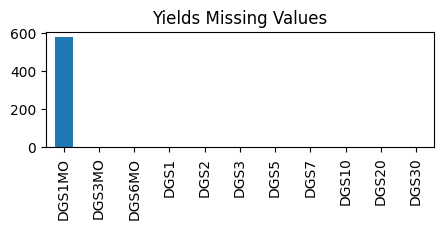

In [ ]:
yields_2000.isna().sum().sort_values(ascending=False).plot(
    kind="bar",
    title="Yields Missing Values",
    figsize=(5, 1.5)
)
plt.show()

### Merge Sentiment Scores with Yield Data

In [ ]:
# Convert dates to period
try:
    speeches_results_df["date"] = speeches_results_df["date"].dt.to_period("D")
except AttributeError:
    pass

try:
    testimony_results_df["date"] = testimony_results_df["date"].dt.to_period("D")
except AttributeError:
    pass

try:
    fomc_results_df["date"] = fomc_results_df["date"].dt.to_period("D")
except AttributeError:
    pass

# Merge with yields
yields_sentiment_speeches = yields_2000.merge(
    speeches_aggs.set_index(speeches_aggs.index.to_period("D")).sort_index(),
    how="outer",
    left_index=True,
    right_index=True
)

yields_sentiment_testimony = yields_2000.merge(
    testimony_aggs.set_index(testimony_aggs.index.to_period("D")).sort_index(),
    how="outer",
    left_index=True,
    right_index=True
)

yields_sentiment_fomc = yields_2000.merge(
    fomc_aggs.set_index(fomc_aggs.index.to_period("D")).sort_index(),
    how="outer",
    left_index=True,
    right_index=True
)

### Correlation Analysis Helper Functions

In [ ]:
days_after_list = [0, 1, 2, 5, 30, 60, 90, 100, 126, 180, 252, 365]

score_dates_speeches = yields_sentiment_speeches[
    yields_sentiment_speeches.score_mean.isna() == False
].index

score_dates_testimony = yields_sentiment_testimony[
    yields_sentiment_testimony.score_mean.isna() == False
].index

score_dates_fomc = yields_sentiment_fomc[
    yields_sentiment_fomc.score_mean.isna() == False
].index


def compute_corrs(in_df, symbols, score_dates):
    """
    Compute correlations between sentiment scores and yield changes.

    Args:
        in_df: DataFrame with yields and scores
        symbols: List of yield symbols
        score_dates: Dates where scores exist

    Returns:
        Tuple of (correlations dict, dataframes dict)
    """
    all_corrs = {}
    all_dfs = {}

    for col in symbols:
        days_after_cols = []
        da_df = in_df[[col, "score_mean"]].copy()

        for days_after in tqdm(days_after_list):
            if days_after == 0:
                days_after_col = f"{col}_{days_after}D"
                days_after_cols.append(days_after_col)
                da_df.loc[:, days_after_col] = (
                    (da_df[col] - da_df[col].shift(1)) /
                    da_df[col].shift(1)
                )
            else:
                days_after_col = f"{col}_{days_after}D"
                days_after_cols.append(days_after_col)
                da_df.loc[:, days_after_col] = (
                    (da_df[col].shift(-1 * days_after) - da_df[col]) /
                    da_df[col]
                )

        corr = (
            da_df.loc[score_dates]
            .dropna()[["score_mean"] + days_after_cols]
            .corr()["score_mean"]
            .drop("score_mean")
        )
        all_corrs[col] = corr
        all_dfs[col] = da_df

        del corr
        del days_after_col
        del da_df

    return all_corrs, all_dfs


def plot_score_corrs(all_corrs, doc_type, image_folder, image_dpi):
    """
    Plot correlation heatmaps for sentiment scores vs. yield changes.

    Args:
        all_corrs: Dictionary of correlations by symbol
        doc_type: Type of document (speeches, testimony, fomc)
        image_folder: Path to save images
        image_dpi: DPI for saved images
    """
    for col, corr in all_corrs.items():
        plt.figure(figsize=(8, 1))
        sns.heatmap(
            corr.to_frame().T,
            annot=True,
            cmap=sns.color_palette("coolwarm", as_cmap=True),
            fmt=".2f",
            linewidths=0.5
        )
        img_title = (
            f"Pearson's Correlation of Score with {col} Yields "
            f"Pct. Change - {doc_type.capitalize()}"
        )
        plt.title(img_title)
        plt.yticks(rotation=0)

        if image_folder is not None:

          image_path = f"{image_folder}/{img_title.lower().replace('-', '').replace(' ', '_').replace('.', '')}"
          image_path = image_path.replace("'", "")
          plt.savefig( image_path
                      , dpi=image_dpi

                      )

        plt.show()

### Compute Correlations for All Document Types

In [ ]:
speeches_corrs, speeches_dfs = compute_corrs(
    in_df=yields_sentiment_speeches,
    symbols=index_symbols,
    score_dates=score_dates_speeches
)

testimony_corrs, testimony_dfs = compute_corrs(
    in_df=yields_sentiment_testimony,
    symbols=index_symbols,
    score_dates=score_dates_testimony
)

fomc_corrs, fomc_dfs = compute_corrs(
    in_df=yields_sentiment_fomc,
    symbols=index_symbols,
    score_dates=score_dates_fomc
)

100%|██████████| 12/12 [00:00<00:00, 1334.17it/s]


#### Correlation Analysis

**In this case we want to see negative correlations since this sentiment is based on anticipated price actions, NOT yields.**

**SO WITH YIELDS - NEGATIVE IS GOOD, POSITIVE IS BAD IN THIS CASE**

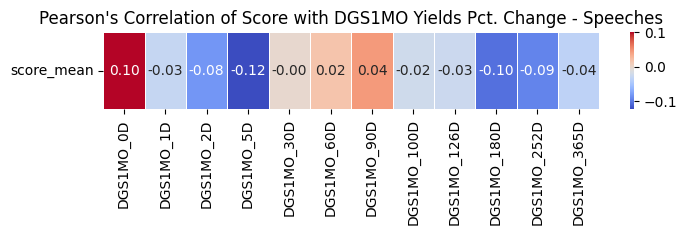

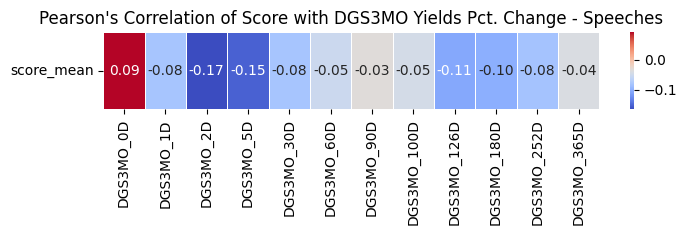

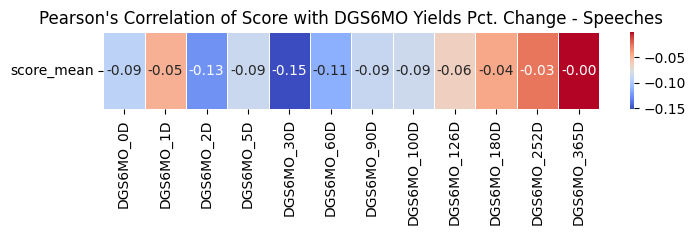

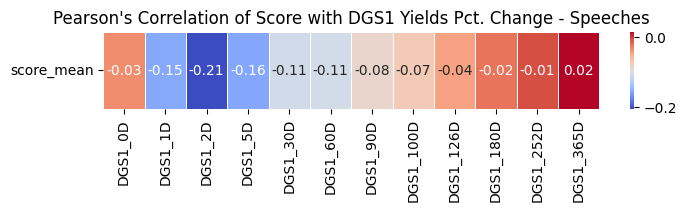

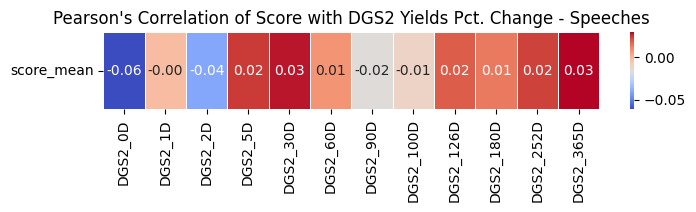

...

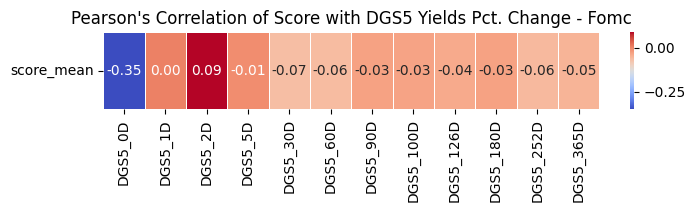

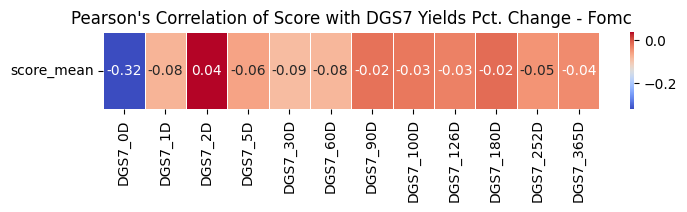

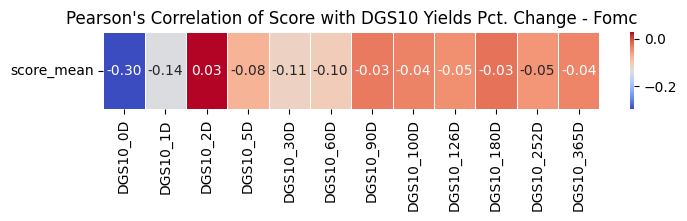

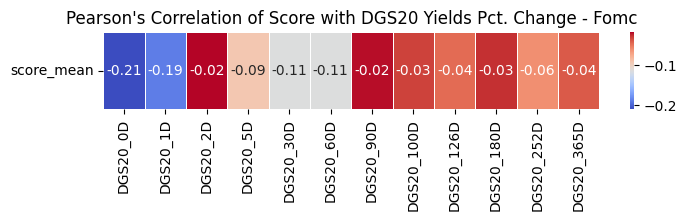

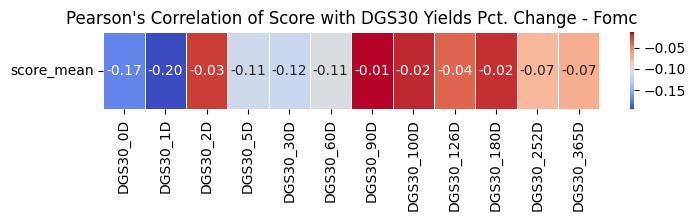

In [ ]:
plot_score_corrs(
    speeches_corrs,
    "speeches",
    image_folder=results_image_folder,
    image_dpi=600
)

plot_score_corrs(
    testimony_corrs,
    "testimony",
    image_folder=results_image_folder,
    image_dpi=600
)

plot_score_corrs(
    fomc_corrs,
    "fomc",
    image_folder=results_image_folder,
    image_dpi=600
)

## Time Decay Exponential Moving Average

Incorporating uneven sentiment data into daily yields with time-weighted exponential moving average. Time weighting diminishes the effect of past values as time increases until the next non-null score.

In [ ]:
from numba import jit


@jit(nopython=True)
def uneven_ema_with_nan(data, times, tau):
    """
    Calculate exponential moving average (EMA) for unevenly-spaced
    time series with NaNs, using variable decay factor.

    Args:
        data: Array of numerical data with potential NaNs
        times: Array of time stamps corresponding to data
        tau: Half-life of the exponential decay

    Returns:
        Array of EMA values with NaNs handled
    """
    if len(data) != len(times):
        raise ValueError("Data and time arrays must have the same length.")

    if len(data) == 0:
        return np.full_like(data, np.nan)

    ema = np.zeros_like(data)

    first_valid_idx = -1
    for i in range(len(data)):
        if not np.isnan(data[i]):
            first_valid_idx = i
            break

    if first_valid_idx == -1:
        return np.full_like(data, np.nan)

    ema[first_valid_idx] = data[first_valid_idx]

    last_valid_ema = ema[first_valid_idx]
    last_valid_time = times[first_valid_idx]

    for i in range(first_valid_idx + 1, len(data)):
        dt = times[i] - last_valid_time
        alpha = 1 - np.exp(-dt / tau)

        if np.isnan(data[i]):
            ema[i] = (1 - alpha) * last_valid_ema
        else:
            ema[i] = alpha * data[i] + (1 - alpha) * last_valid_ema
            last_valid_ema = ema[i]
            last_valid_time = times[i]

    return ema

### Merge All Sentiment Scores with FRED Data

In [ ]:
min_fred_date = pd.date_range("2006-01-01", periods=1).to_period("D")[0]
fred_sentiment_data = yields_2000.loc[yields_2000.index >= min_fred_date]

# Merge all sentiment scores
fred_sentiment_data_scored = fred_sentiment_data.merge(
    speeches_aggs.set_index(speeches_aggs.index.to_period("D")).sort_index(),
    how="outer",
    left_index=True,
    right_index=True
)
fred_sentiment_data_scored.rename(
    columns={"score_mean": "mean_sentiment_score_speeches"},
    inplace=True
)

fred_sentiment_data_scored = fred_sentiment_data_scored.merge(
    testimony_aggs.set_index(testimony_aggs.index.to_period("D")).sort_index(),
    how="outer",
    left_index=True,
    right_index=True
)
fred_sentiment_data_scored.rename(
    columns={"score_mean": "mean_sentiment_score_testimony"},
    inplace=True
)

fred_sentiment_data_scored = fred_sentiment_data_scored.merge(
    fomc_aggs.set_index(fomc_aggs.index.to_period("D")).sort_index(),
    how="outer",
    left_index=True,
    right_index=True
)
fred_sentiment_data_scored.rename(
    columns={"score_mean": "mean_sentiment_score_fomc"},
    inplace=True
)

# Truncate to end in 2024
fred_sentiment_data_scored = fred_sentiment_data_scored[
    fred_sentiment_data_scored.index <= "2024-12-31"
]

### Apply Time Decay EMA

In [ ]:
score_types = ["fomc", "testimony", "speeches"]

In [ ]:
def get_avg_time_diff(in_df, sentiment_type, score_types=score_types):
    """
    Get average time difference between sentiment scores.

    Args:
        in_df: DataFrame with sentiment scores
        sentiment_type: Type of sentiment (speeches, testimony, fomc)

    Returns:
        Mean time difference between non-null scores
    """
    sentiment_col = f"mean_sentiment_score_{sentiment_type}"
    df_num_idx = in_df.reset_index().rename(columns={"index": "date"})

    # Use np.nanmean to skip NaN created by .diff() in first row
    mean_diff = np.nanmean(
        np.array(
            df_num_idx[df_num_idx[sentiment_col].isna() == False]
            .index.diff()
        )
    )
    return mean_diff


for score_type in score_types:
    values = fred_sentiment_data_scored[
        f"mean_sentiment_score_{score_type}"
    ].values
    timesteps = list(range(len(fred_sentiment_data_scored)))

    tau = get_avg_time_diff(
        in_df=fred_sentiment_data_scored,
        sentiment_type=score_type
    )

    print(f"Tau {score_type}: ", tau)

    # Calculate the time-weighted EMA
    ema_scores = uneven_ema_with_nan(values, timesteps, tau)

    fred_sentiment_data_scored[f"mean_sentiment_ema_{score_type}"] = (
        ema_scores
    )

    del ema_scores
    del tau

# Convert index to timestamp for plotting
fred_sentiment_data_scored.index = (
    fred_sentiment_data_scored.index.to_timestamp()
)

Tau fomc:  34.48
Tau testimony:  65.23300970873787
Tau speeches:  20.284023668639055


### Visualize Sentiment Score EMAs

In [ ]:
plotly_bar_chart(
    df=fred_sentiment_data_scored,
    y_col_name="mean_sentiment_ema_speeches",
    title="Sentiment Score EMA - Dynamic Time Decay: Speeches: GPT-5",
    line_color="navy",
    bg_color="white",
    image_folder=results_image_folder
)

plotly_bar_chart(
    df=fred_sentiment_data_scored,
    y_col_name="mean_sentiment_ema_testimony",
    title="Sentiment Score EMA - Dynamic Time Decay: Testimony: GPT-5",
    line_color="navy",
    bg_color="white",
    image_folder=results_image_folder
)

plotly_bar_chart(
    df=fred_sentiment_data_scored,
    y_col_name="mean_sentiment_ema_fomc",
    title="Sentiment Score EMA - Dynamic Time Decay: FOMC: GPT-5",
    line_color="navy",
    bg_color="white",
    image_folder=results_image_folder
)

## Wavelet Denoising for Signal Processing

Apply wavelet denoising to smooth sentiment signals and reduce noise.

In [ ]:
def wavelet_denoise(series, wavelet="db4", threshold_scale=0.6):
    """
    Wavelet denoising with length preservation.

    Args:
        series: Input time series
        wavelet: Wavelet type (default 'db4')
        threshold_scale: Scaling factor for threshold

    Returns:
        Denoised series as pandas Series
    """
    original_length = len(series)
    original_index = series.index

    # Perform wavelet decomposition
    coeffs = pywt.wavedec(series.values, wavelet, mode="periodization")

    # Apply thresholding
    sigma = np.median(np.abs(coeffs[-1])) / 0.6745
    thr = threshold_scale * sigma
    coeffs = [coeffs[0]] + [
        pywt.threshold(c, thr, mode="soft") for c in coeffs[1:]
    ]

    # Reconstruct signal
    reconstructed = pywt.waverec(coeffs, wavelet, mode="periodization")

    # Fix length mismatch - truncate or pad to match original
    if len(reconstructed) > original_length:
        reconstructed = reconstructed[:original_length]
    elif len(reconstructed) < original_length:
        # Pad with the last value
        reconstructed = np.pad(
            reconstructed,
            (0, original_length - len(reconstructed)),
            mode="edge"
        )

    # Return with original index
    return pd.Series(reconstructed, index=original_index)


# Apply wavelet denoising to sentiment scores
for score_type in score_types:
    fred_sentiment_data_scored[f"wavelet_denoise_{score_type}"] = (
        wavelet_denoise(
            fred_sentiment_data_scored[f"mean_sentiment_ema_{score_type}"]
        )
    )

    # Apply exponential weighted moving averages
    for n in [5, 10, 20, 50, 100, 200]:
        fred_sentiment_data_scored[f"wavelet_denoise_ewm{n}_{score_type}"] = (
            fred_sentiment_data_scored[f"wavelet_denoise_{score_type}"]
            .ewm(span=n, adjust=False)
            .mean()
        )

### Add Cumulative Returns for Comparison

In [ ]:
# Compute cumulative returns for treasury symbols
for symbol in index_symbols:
    fred_sentiment_data_scored.loc[:, f"{symbol}_cum_ret"] = (
        (
            1 +
            fred_sentiment_data_scored[symbol]
            .pct_change()
            .replace([np.inf, -np.inf], np.nan)
            .fillna(0)
        ).cumprod() - 1
    )

# Save the processed data
SAVE_SCORED = False
if SAVE_SCORED:
    fred_sentiment_data_scored.to_parquet(
        f"{base_path}/FRED/fred_sentiment_data_scored_smoothed.parquet"
    )
else:
    fred_sentiment_data_scored = pd.read_parquet(
        f"{base_path}/FRED/fred_sentiment_data_scored_smoothed.parquet"
    )

In [ ]:
def plot_smoothed_comparison(
    doctype: str,
    index_symbols,
    figsize=(30, 30),
    rows=9,
    cols=6,
) -> None:
    """
    Plot comparison of wavelet denoised sentiment vs cumulative returns.

    Creates a grid of subplots showing the relationship between
    exponentially weighted moving averages of wavelet-denoised sentiment
    scores and cumulative returns for each treasury symbol.

    Args:
        doctype: Type of document ('fomc', 'speeches', 'testimony')
        index_symbols: List of treasury symbols (e.g., ['DGS1', 'DGS10'])
        figsize: Figure size as (width, height) tuple
        rows: Number of subplot rows
        cols: Number of subplot columns
    """
    spans_list = [5, 10, 20, 50, 100, 200]

    # Professional color scheme
    color_a = "#2E86AB"  # Professional blue
    color_b = "#A23B72"  # Deep magenta/purple

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    for i, symbol in enumerate(sorted(index_symbols)):
        for k, n in enumerate(spans_list):
            # Plot denoised sentiment
            axes[i][k].plot(
                fred_sentiment_data_scored[
                    f"wavelet_denoise_ewm{n}_{doctype}"
                ],
                color=color_a,
                label=f"Denoised Sentiment EWA{n}",
            )
            # Plot cumulative returns
            axes[i][k].plot(
                fred_sentiment_data_scored[f"{symbol}_cum_ret"],
                color=color_b,
                label=f"{symbol} Cuml. Returns",
            )
            axes[i][k].tick_params(axis="x", rotation=45)
            axes[i][k].set_title(
                f"{symbol} Cuml. Rets vs. Sentiment EWA{n}"
            )

    # Add main title with proper spacing
    title = (
        f"Exponentially Weighted Avg. of Wavelet Denoised "
        f"{doctype.upper()} Sentiment for Prices vs. "
        f"Cumulative Percent Change (Returns) on DGS Curves (Yields)"
    )
    fig.suptitle(title, fontsize=20, y=0.998, weight="bold")

    # Get legend from first subplot
    handles, labels = axes[0][0].get_legend_handles_labels()
    labels = [
        "EMA+Wavelet Denoised Sentiment",
        "DGS Series Cuml. Returns",
    ]

    fig.legend(
        handles,
        labels,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.992),
        ncol=2,
        frameon=True,
        fontsize=20,
        fancybox=True,
        shadow=True,
    )

    fig.tight_layout(rect=[0, 0, 1, 0.985])
    plt.show()

In [ ]:
# Removing DGS1MO and 3MO
index_symbols = set(index_symbols) - set(['DGS1MO', 'DGS3MO'])

**Simple Wavelet + EMW Smoothing in Comparison to the Cumulative Returns of the DGS Curves**

- This is a comparison of the full time series.
- Model Training Data is handled differently to avoid data leakage.









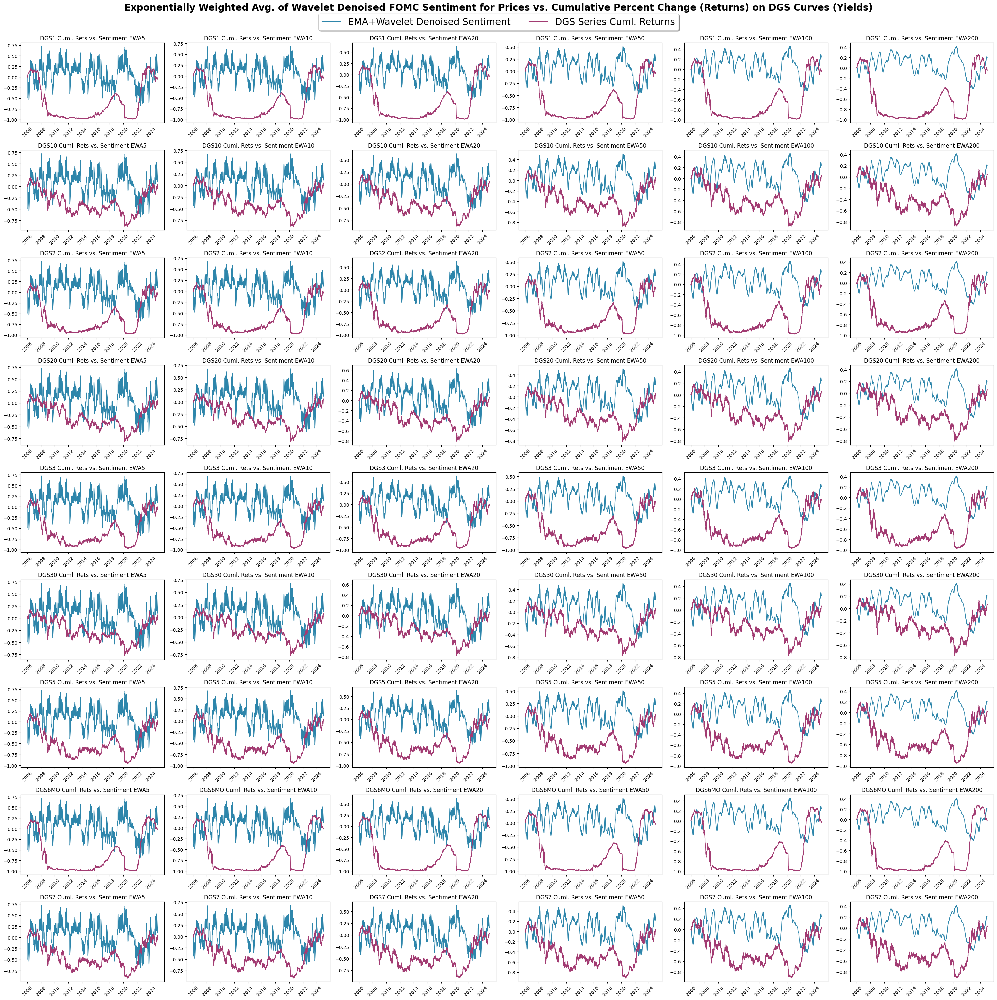

In [ ]:
plot_smoothed_comparison( doctype = 'fomc', index_symbols=index_symbols)

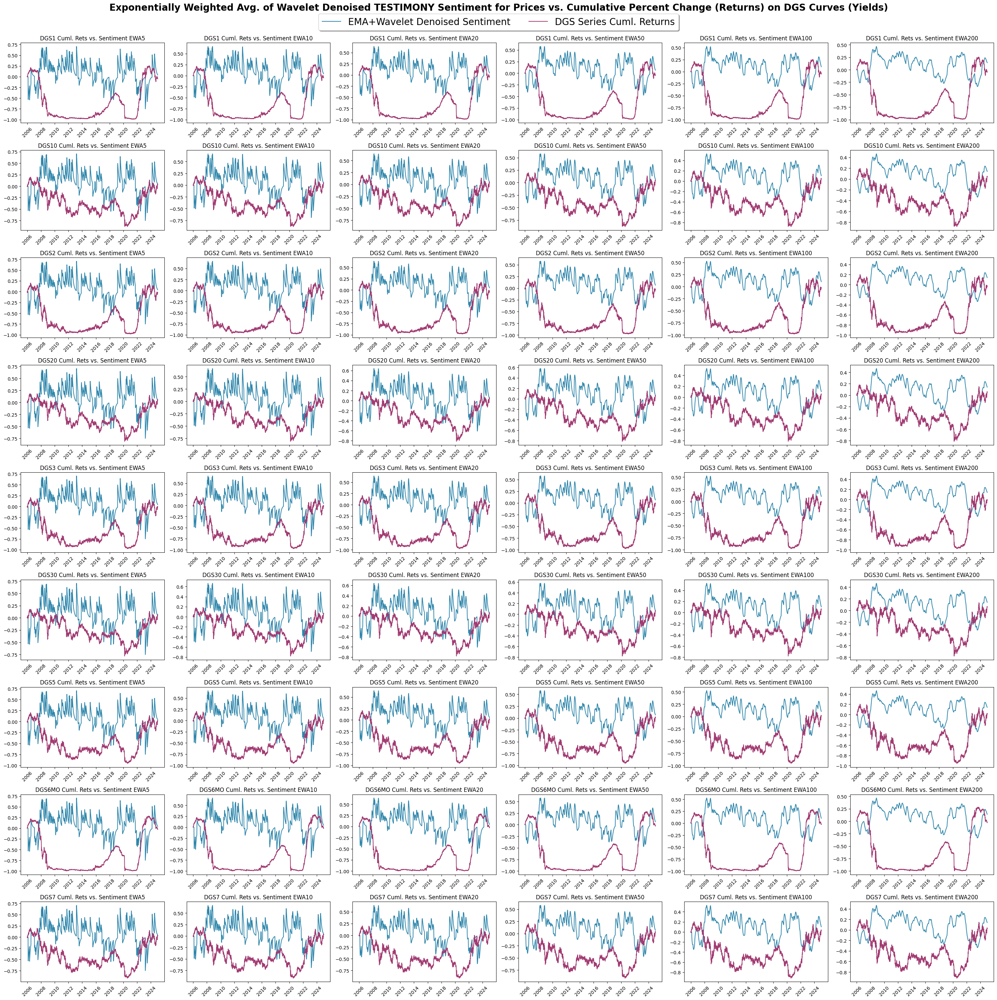

In [ ]:
plot_smoothed_comparison( doctype = 'testimony', index_symbols=index_symbols)

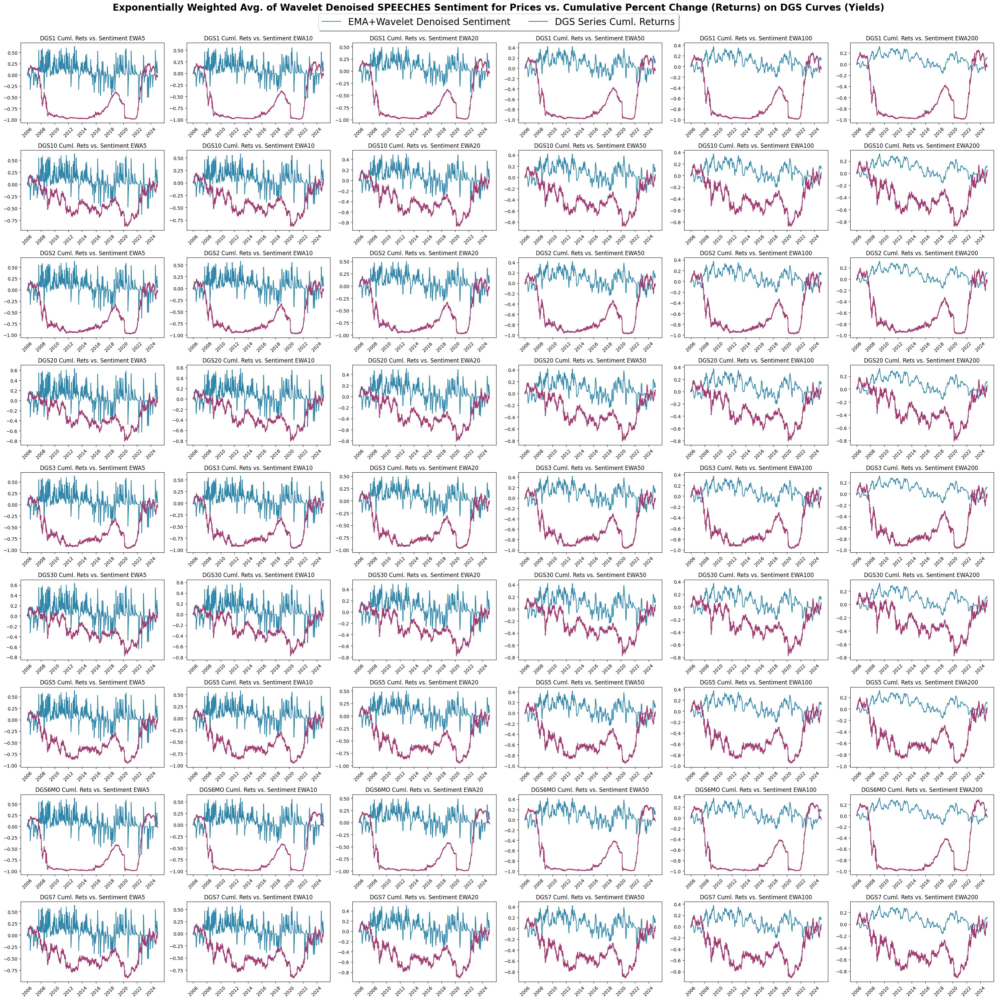

In [ ]:
plot_smoothed_comparison( doctype = 'speeches', index_symbols=index_symbols)

#Feature Importance

In [ ]:
!pip install -q optuna==4.4.0

## Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import optuna
from xgboost import XGBRegressor
from scipy.fft import fft, ifft
import pywt
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import shap
from statsmodels.tsa.stattools import acf
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.stattools import adfuller as adf
import os
import re
import uuid

## Load Data

In [ ]:
fred_sentiment_data = pd.read_parquet(
    f"{base_path}/FRED/fred_sentiment_data_scored_smoothed.parquet"
)

## Define DGS Index Symbols

In [ ]:
dgs_index_symbols = [
    "DGS6MO", "DGS1", "DGS2", "DGS3", "DGS5",
    "DGS7", "DGS10", "DGS20", "DGS30"
]

In [ ]:
in_df = fred_sentiment_data[
    dgs_index_symbols + [
        c for c in fred_sentiment_data.columns if "wavelet" in c
    ]
]

assert in_df.isna().sum().sum() == 0, "Df Contains NaNs"

## Feature Importance

- Offset - the X, y temporal Offset, e.g. 1 Means predictions made 1 day in the future.
- Dynamic Autocorrelation Mitigation Gap used, Depends on statstools.
- Trains XGBoost using Walk Forward Cross Validation, followed by SHAP.
- Additional Features added to compare ratios and differencing at different smoothing levels.
- SHAP values calculated on entire dataset, based in the best model for each DGS Index (10 Optuna Trials each).
- DGS Data Smoothed with db6 wavelet

## Check CUDA Availability

In [ ]:
cuda_avail = os.popen("nvidia-smi").read()

if cuda_avail is None:
    cuda_avail = os.popen("nvcc --version").read()

print(cuda_avail)

## Custom XGBoost Loss Function

### Penalty Gradient Function

In [ ]:
def penalty_gradient_fn(y_pred, y, lambda_dir, s, C):
    """
    Convert mathematical formula to NumPy implementation.

    Original formula:
    (8 * s * λ * (x - y) * e^(2 * (s * (x - y)^2 + C))) /
    (e^(2 * s * (x - y)^2) + e^(2 * C))^2

    Where:
        λ → lambda_dir
        x → y_pred
        y → y (unchanged)
        s → s (unchanged)
        C → C (unchanged)

    Parameters
    ----------
    y_pred : np.ndarray
        Predicted values (replaces x).
    y : np.ndarray
        True target values (replaces y).
    lambda_dir : float
        Lambda direction parameter (replaces λ).
    s : float or np.ndarray
        S parameter.
    C : float or np.ndarray
        C parameter.

    Returns
    -------
    result : np.ndarray
        Computed gradient.
    """
    # Pre-compute common terms
    diff = y_pred - y  # (x - y)
    diff_sq = diff**2  # (x - y)^2

    # Compute the inner exponent: s * (x - y)^2 + C
    inner_exp = s * diff_sq + C

    # Compute the full exponent for numerator: 2 * (s * (x - y)^2 + C)
    full_exponent = 2 * inner_exp

    # Compute exponential terms
    exp_full = np.exp(full_exponent)
    exp_2s_diff = np.exp(2 * s * diff_sq)
    exp_2C = np.exp(2 * C)

    # Numerator: 8 * s * lambda_dir * (y_pred - y) * exp_full
    numerator = 8 * s * lambda_dir * diff * exp_full

    # Denominator: (e^(2 * s * (x - y)^2) + e^(2 * C))^2
    denominator = (exp_2s_diff + exp_2C)**2

    # Final result
    result = numerator / denominator

    return result

### Test Penalty Gradient Function

In [ ]:
# Test with simple values
y_pred = np.array([0.5, 1.0, 1.5, 2.0])
y = np.array([0.4, 0.9, 1.6, 2.1])
lambda_dir = 1.0
s = 1.0
C = 0.0

result = penalty_gradient_fn(y_pred, y, lambda_dir, s, C)

print(f"\ny_pred:     {y_pred}")
print(f"y:          {y}")
print(f"lambda_dir: {lambda_dir}")
print(f"s:          {s}")
print(f"C:          {C}")
print(f"\nGradient:   {result}")


y_pred:     [0.5 1.  1.5 2. ]
y:          [0.4 0.9 1.6 2.1]
lambda_dir: 1.0
s:          1.0
C:          0.0

Gradient:   [ 0.19998  0.19998 -0.19998 -0.19998]


In [ ]:
# Test with edge cases
print("\n" + "="*70)
print("Edge case testing:")
print("="*70)

# Test 1: Perfect predictions
y_pred_perfect = np.array([1.0, 2.0, 3.0])
y_perfect = np.array([1.0, 2.0, 3.0])
result_perfect = penalty_gradient_fn(
    y_pred_perfect, y_perfect, lambda_dir, s, C
)
print(f"\nPerfect predictions (y_pred = y):")
print(f"  Gradient: {result_perfect}")

# Test 2: Large differences
y_pred_large = np.array([1.0, 2.0, 3.0])
y_large = np.array([5.0, 6.0, 7.0])
result_large = penalty_gradient_fn(
    y_pred_large, y_large, lambda_dir, s, C
)
print(f"\nLarge differences:")
print(f"  Gradient: {result_large}")


Edge case testing:

Perfect predictions (y_pred = y):
  Gradient: [0. 0. 0.]

Large differences:
  Gradient: [-4.05253298e-13 -4.05253298e-13 -4.05253298e-13]


In [ ]:
# Test 3: Different s values
print(f"\nTesting different s values:")
for s_val in [0.5, 1.0, 2.0, 5.0]:
    res = penalty_gradient_fn(y_pred, y, lambda_dir, s_val, C)
    print(f"  s={s_val}: {res}")


Testing different s values:
  s=0.5: [ 0.0999975  0.0999975 -0.0999975 -0.0999975]
  s=1.0: [ 0.19998  0.19998 -0.19998 -0.19998]
  s=2.0: [ 0.39984004  0.39984004 -0.39984004 -0.39984004]
  s=5.0: [ 0.99750416  0.99750416 -0.99750416 -0.99750416]


In [ ]:
# Test 4: Different C values
print(f"\nTesting different C values:")
for c_val in [-1.0, 0.0, 1.0, 2.0]:
    res = penalty_gradient_fn(y_pred, y, lambda_dir, s, c_val)
    print(f"  C={c_val}: {res}")


Testing different C values:
  C=-1.0: [ 0.08272171  0.08272171 -0.08272171 -0.08272171]
  C=0.0: [ 0.19998  0.19998 -0.19998 -0.19998]
  C=1.0: [ 0.08528046  0.08528046 -0.08528046 -0.08528046]
  C=2.0: [ 0.01440514  0.01440514 -0.01440514 -0.01440514]


In [ ]:
# Test 5: Different lambda_dir values
print(f"\nTesting different lambda_dir values:")
for ld in [0.1, 0.5, 1.0, 2.0]:
    res = penalty_gradient_fn(y_pred, y, ld, s, C)
    print(f"  lambda_dir={ld}: {res}")


Testing different lambda_dir values:
  lambda_dir=0.1: [ 0.019998  0.019998 -0.019998 -0.019998]
  lambda_dir=0.5: [ 0.09999  0.09999 -0.09999 -0.09999]
  lambda_dir=1.0: [ 0.19998  0.19998 -0.19998 -0.19998]
  lambda_dir=2.0: [ 0.39996  0.39996 -0.39996 -0.39996]


### Penalty Hessian Function

In [ ]:
def penalty_hessian_fn(y_pred, y, lambda_dir, s, C):
    """
    Convert mathematical formula to NumPy implementation.

    Original formula:
    -(8 * s * λ * ((4 * s * (x - y)^2 - 1) * e^(2 * s * (x - y)^2) -
    e^(2 * C) * (4 * s * (x - y)^2 + 1)) * e^(2 * (s * (x - y)^2 + C))) /
    (e^(2 * s * (x - y)^2) + e^(2 * C))^3

    Where:
        λ → lambda_dir
        x → y_pred
        y → y (unchanged)
        s → s (unchanged)
        C → C (unchanged)

    Parameters
    ----------
    y_pred : np.ndarray
        Predicted values (replaces x).
    y : np.ndarray
        True target values (replaces y).
    lambda_dir : float
        Lambda direction parameter (replaces λ).
    s : float or np.ndarray
        S parameter.
    C : float or np.ndarray
        C parameter.

    Returns
    -------
    result : np.ndarray
        Computed Hessian (second derivative).
    """
    # Pre-compute common terms
    diff = y_pred - y  # (x - y)
    diff_sq = diff**2  # (x - y)^2

    # Compute the inner exponent: s * (x - y)^2 + C
    inner_exp = s * diff_sq + C

    # Compute the full exponent: 2 * (s * (x - y)^2 + C)
    full_exponent = 2 * inner_exp

    # Compute exponential terms
    exp_full = np.exp(full_exponent)
    exp_2s_diff = np.exp(2 * s * diff_sq)
    exp_2C = np.exp(2 * C)

    # Compute the term: 4 * s * (x - y)^2
    term_4s_diff_sq = 4 * s * diff_sq

    # Compute the inner bracket
    inner_bracket = (
        (term_4s_diff_sq - 1) * exp_2s_diff -
        exp_2C * (term_4s_diff_sq + 1)
    )

    # Numerator: -8 * s * lambda_dir * inner_bracket * exp_full
    numerator = -8 * s * lambda_dir * inner_bracket * exp_full

    # Denominator: (e^(2 * s * (x - y)^2) + e^(2 * C))^3
    denominator = (exp_2s_diff + exp_2C)**3

    # Final result
    result = numerator / denominator

    return result

### Test Penalty Hessian Function

In [ ]:

print("Testing hessian_fn formula conversion...")

# Test with simple values
y_pred = np.array([0.5, 1.0, 1.5, 2.0])
y = np.array([0.4, 0.9, 1.6, 2.1])
lambda_dir = 1.0
s = 1.0
C = 0.0

result = penalty_hessian_fn(y_pred, y, lambda_dir, s, C)

print(f"\ny_pred:     {y_pred}")
print(f"y:          {y}")
print(f"lambda_dir: {lambda_dir}")
print(f"s:          {s}")
print(f"C:          {C}")
print(f"\nHessian:    {result}")

Testing hessian_fn formula conversion...

y_pred:     [0.5 1.  1.5 2. ]
y:          [0.4 0.9 1.6 2.1]
lambda_dir: 1.0
s:          1.0
C:          0.0

Hessian:    [1.99900012 1.99900012 1.99900012 1.99900012]


In [ ]:
# Test with edge cases
print("\n" + "="*70)
print("Edge case testing:")
print("="*70)

# Test 1: Perfect predictions
y_pred_perfect = np.array([1.0, 2.0, 3.0])
y_perfect = np.array([1.0, 2.0, 3.0])
result_perfect = penalty_hessian_fn(
    y_pred_perfect, y_perfect, lambda_dir, s, C
)
print(f"\nPerfect predictions (y_pred = y):")
print(f"  Hessian: {result_perfect}")

# Test 2: Large differences
y_pred_large = np.array([1.0, 2.0, 3.0])
y_large = np.array([5.0, 6.0, 7.0])
result_large = penalty_hessian_fn(
    y_pred_large, y_large, lambda_dir, s, C
)
print(f"\nLarge differences:")
print(f"  Hessian: {result_large}")


Edge case testing:

Perfect predictions (y_pred = y):
  Hessian: [2. 2. 2.]

Large differences:
  Hessian: [-6.38273944e-12 -6.38273944e-12 -6.38273944e-12]


In [ ]:
# Test 3: Different s values
print(f"\nTesting different s values:")
for s_val in [0.5, 1.0, 2.0, 5.0]:
    res = penalty_hessian_fn(y_pred, y, lambda_dir, s_val, C)
    print(f"  s={s_val}: {res}")


Testing different s values:
  s=0.5: [0.999875 0.999875 0.999875 0.999875]
  s=1.0: [1.99900012 1.99900012 1.99900012 1.99900012]
  s=2.0: [3.99200384 3.99200384 3.99200384 3.99200384]
  s=5.0: [9.87537423 9.87537423 9.87537423 9.87537423]


In [ ]:
# Test 4: Different C values
print(f"\nTesting different C values:")
for c_val in [-1.0, 0.0, 1.0, 2.0]:
    res = penalty_hessian_fn(y_pred, y, lambda_dir, s, c_val)
    print(f"  C={c_val}: {res}")


Testing different C values:
  C=-1.0: [0.80187901 0.80187901 0.80187901 0.80187901]
  C=0.0: [1.99900012 1.99900012 1.99900012 1.99900012]
  C=1.0: [0.8786399 0.8786399 0.8786399 0.8786399]
  C=2.0: [0.1496021 0.1496021 0.1496021 0.1496021]


In [ ]:
# Test 5: Different lambda_dir values
print(f"\nTesting different lambda_dir values:")
for ld in [0.1, 0.5, 1.0, 2.0]:
    res = penalty_hessian_fn(y_pred, y, ld, s, C)
    print(f"  lambda_dir={ld}: {res}")


Testing different lambda_dir values:
  lambda_dir=0.1: [0.19990001 0.19990001 0.19990001 0.19990001]
  lambda_dir=0.5: [0.99950006 0.99950006 0.99950006 0.99950006]
  lambda_dir=1.0: [1.99900012 1.99900012 1.99900012 1.99900012]
  lambda_dir=2.0: [3.99800024 3.99800024 3.99800024 3.99800024]


In [ ]:
# Test 6: Verify Hessian is positive (for stability)
print(
    f"\nChecking if Hessian values are positive "
    f"(for numerical stability):"
)
print(f"  All positive: {np.all(result > 0)}")
print(f"  Min value: {np.min(result):.6f}")
print(f"  Max value: {np.max(result):.6f}")


Checking if Hessian values are positive (for numerical stability):
  All positive: False
  Min value: -0.199980
  Max value: 0.199980


### Loss Class

In [ ]:
import xgboost as xgb


class XgbMseDir:
    """
    Computes a loss that combines both MSE and a direction penalty.
    The severity of the direction penalty is based the lambda_dir parameter.
    """

    def __init__(self, lambda_dir: float = 1.0, use_raw_calc=False):
        assert lambda_dir > 0, "lambda_dir must be positive"
        self.lambda_dir = lambda_dir
        self.use_raw_calc = use_raw_calc

    def loss_fn(self, labels: np.ndarray, predt: np.ndarray):
        y = labels
        y_pred = predt

        y_true_series = pd.Series(y)
        y_diff_series = y_true_series.diff()
        dy = y_diff_series.fillna(0).to_numpy()

        # --- MSE part ---
        diff = y_pred - y
        grad_mse = diff
        hess_mse = np.ones_like(diff)

        # --- Direction penalty (smooth- twice differentiable) ---
        mse = diff**2
        d_term = y_pred*y

        # Constant Term to make sure tanh stays at 1 for correct direction
        C = np.where(d_term >= 0, 20, 0)

        # scaling_factor
        s = (
            10.0 ** np.where(
                d_term >= 0, np.ceil(-np.log10(mse + 1e-16)), 0
            )
        )
        grad_pen = penalty_gradient_fn(y_pred, y, self.lambda_dir, s, C)
        hess_pen = penalty_hessian_fn(y_pred, y, self.lambda_dir, s, C)

        grad = grad_mse + grad_pen
        hess = hess_mse + (hess_pen + 1e-6)

        return grad, hess

    def eval_metric(self, labels: np.ndarray, predt: np.ndarray):
        y = labels
        y_pred = predt

        mse_elems = y_pred - y
        mse = mse_elems**2

        d_term = y_pred*y

        # Constant Term to make sure tanh stays at 1 for correct direction
        C = np.where(d_term >= 0, 20, 0)

        # scaling_factor + 1e-16 to avoid DIV BY ZERO error if mse = 0
        s = (
            10.0 ** np.where(
                d_term >= 0, np.ceil(-np.log10(mse + 1e-16)), 0
            )
        )

        pen_elems = self.lambda_dir * (
            1 - np.tanh((-((y_pred - y)**2) * (s)) + C)
        )

        return "rmse_dir", np.mean(mse**0.5 + pen_elems)

### Initialize Custom Loss and Metric

In [ ]:
from sklearn.model_selection import train_test_split

LAMBDA_DIR = 1.0

dir_reg = XgbMseDir(lambda_dir=LAMBDA_DIR, use_raw_calc=False)


def custom_eval_metric(labels: np.ndarray, predt: np.ndarray):
    return dir_reg.eval_metric(labels, predt)


def custom_loss_fn(labels: np.ndarray, predt: np.ndarray):
    return dir_reg.loss_fn(labels, predt)

In [ ]:
custom_loss_fn(
    np.array([1.3, -4, -1.7643, 0.0007, 0.997]),
    np.array([1.2, -4, -1.7643, 0.0007, -0.0001])
)

(array([-0.1       ,  0.        ,  0.        ,  0.        , -1.84202185]),
 array([ 1.000001  ,  1.33986934,  1.33986934,  1.33986934, -0.71087261]))

## Prepare Training Data

In [ ]:
# ONLY keep the DGS symbols and the originally smoothed signal
# (Time Decay), without wavelet smoothing
training_df = fred_sentiment_data[
    dgs_index_symbols + [
        c for c in fred_sentiment_data.columns
        if "mean_sentiment_ema" in c
    ]
]

In [ ]:
training_df.head(3)

,DGS6MO,DGS1,DGS2,DGS3,DGS5,DGS7,DGS10,DGS20,DGS30,mean_sentiment_ema_fomc,mean_sentiment_ema_testimony,mean_sentiment_ema_speeches
2006-01-01,4.37,4.38,4.41,4.37,4.35,4.36,4.39,4.61,4.51,0.0,0.0,0.0
2006-01-02,4.37,4.38,4.41,4.37,4.35,4.36,4.39,4.61,4.51,0.0,0.0,0.0
2006-01-03,4.40,4.38,4.34,4.30,4.30,4.32,4.37,4.62,4.52,0.0,0.0,0.0


## SHAP Model Training

In [ ]:
OFFSET = 1
DEVICE = "cuda" if cuda_avail is not None else "cpu"

### Dynamic Gap Function

In [ ]:
def estimate_gap(y, threshold=0.1, max_lag=20):
    """Estimate gap between train/test to reduce autocorrelation."""
    acf_vals = acf(y, nlags=max_lag)
    for lag, val in enumerate(acf_vals):
        if abs(val) < threshold:
            return lag
    return max_lag  # fallback

### Walk-Forward CV with Purge

In [ ]:
#@title  WFCV with Purge Function
def walk_forward_cv_w_purge(
    X, y, n_splits=5, train_size=0.6, max_gap=50
):
    """
    Walk-forward CV with a constant-length training window and purge gap.

    Args:
        X (pd.DataFrame or np.ndarray): Feature matrix.
        y (pd.Series or np.ndarray): Target array.
        n_splits (int): Number of folds.
        train_size (float): Fraction of data to use for training
                            (constant per fold).
        max_gap (int): Number of samples to skip between train and test
                       to remove autocorrelation.

    Returns:
        List of (train_idx, test_idx) tuples.
    """
    n = len(X)
    splits = []
    train_len = int(n * train_size)
    test_len = int((n - train_len) / n_splits)

    for i in range(n_splits):
        train_start = i * test_len
        train_end = train_start + train_len

        test_start = train_end
        test_end = test_start + test_len

        if test_end > n:
            break  # avoid incomplete last fold

        train_idx = np.arange(train_start, train_end)
        test_idx = np.arange(test_start, test_end)

        # -- Gap for auto corr reduction
        y_this = y.iloc[np.concatenate((train_idx, test_idx))]

        try:
            gap = estimate_gap(y_this, threshold=0.1, max_lag=max_gap)
        except:
            gap = 3

        adj_train_end = train_end + gap
        adj_test_start = adj_train_end
        adj_test_end = adj_test_start + test_len
        adj_test_end = min(adj_test_end, n-1)

        adj_train_idx = np.arange(train_start, train_end)
        adj_test_idx = np.arange(adj_test_start, adj_test_end)
        splits.append((adj_train_idx, adj_test_idx))

    return splits

### Wavelet Denoising Functions

In [ ]:
def wavelet_denoise_fit(
    signal, wavelet="db4", level=3, threshold_scale=0.6
):
    """
    Fit wavelet denoising parameters using ONLY training data.

    Args:
        signal: Training signal to fit wavelet parameters
        wavelet: Wavelet type (default 'db4')
        level: Decomposition level
        threshold_scale: Scaling factor for threshold

    Returns:
        Dictionary containing fitted parameters
    """
    # Remove NaN values for wavelet decomposition
    clean_signal = (
        signal.dropna() if isinstance(signal, pd.Series)
        else signal[~np.isnan(signal)]
    )

    # Perform wavelet decomposition
    coeffs = pywt.wavedec(
        clean_signal, wavelet, level=level, mode="periodization"
    )

    # Calculate threshold using MAD on training data only
    sigma = np.median(np.abs(coeffs[-1])) / 0.6745
    threshold = threshold_scale * sigma

    return {
        "threshold": threshold,
        "wavelet": wavelet,
        "level": level,
        "sigma": sigma,
        "threshold_scale": threshold_scale
    }

In [ ]:
#@title Wavelet Denoising Functions

def wavelet_denoise_transform(signal, params):
    """
    Transform signal using pre-fitted wavelet parameters (NO LEAKAGE).

    Args:
        signal: Signal to denoise (can be train or test)
        params: Dictionary of parameters from wavelet_denoise_fit()

    Returns:
        Denoised signal as pandas Series
    """
    original_length = len(signal)
    original_index = (
        signal.index if isinstance(signal, pd.Series) else None
    )
    signal_values = (
        signal.values if isinstance(signal, pd.Series) else signal
    )

    # Decompose using parameters from training
    coeffs = pywt.wavedec(
        signal_values, params["wavelet"],
        level=params["level"], mode="periodization"
    )

    # Apply threshold from training data
    coeffs_thresh = (
        [coeffs[0]] +
        [pywt.threshold(c, params["threshold"], mode="soft")
         for c in coeffs[1:]]
    )

    # Reconstruct
    reconstructed = pywt.waverec(
        coeffs_thresh, params["wavelet"], mode="periodization"
    )

    # Fix length mismatch
    if len(reconstructed) > original_length:
        reconstructed = reconstructed[:original_length]
    elif len(reconstructed) < original_length:
        reconstructed = np.pad(
            reconstructed,
            (0, original_length - len(reconstructed)),
            mode="edge"
        )

    # Return as Series with original index
    if original_index is not None:
        return pd.Series(reconstructed, index=original_index)
    return pd.Series(reconstructed)

In [ ]:
#@title Wavelet Fit Function
def wavelet_data_fit(df_train, score_types):
    """
    Fit wavelet parameters on TRAINING data only (NO LEAKAGE).

    Args:
        df_train: Training dataframe
        score_types: List of score types to process

    Returns:
        Dictionary of fitted wavelet parameters for each score type
    """
    wavelet_params = {}

    for score_type in score_types:
        col_name = f"mean_sentiment_ema_{score_type}"
        if col_name in df_train.columns:
            # Fit wavelet parameters ONLY on training data
            params = wavelet_denoise_fit(df_train[col_name])
            wavelet_params[score_type] = params

    return wavelet_params

In [ ]:
def wavelet_data_transform(df, score_types, wavelet_params):
    """
    Transform data using pre-fitted wavelet parameters (NO LEAKAGE).

    Args:
        df: Dataframe to transform (can be train or test)
        score_types: List of score types
        wavelet_params: Pre-fitted parameters from wavelet_data_fit()

    Returns:
        Transformed dataframe with wavelet features
    """
    df_transformed = df.copy()

    for score_type in score_types:
        col_name = f"mean_sentiment_ema_{score_type}"

        if (col_name in df_transformed.columns and
                score_type in wavelet_params):
            # Apply transformation using parameters from training data only
            dn_signal = wavelet_denoise_transform(
                df_transformed[col_name],
                wavelet_params[score_type]
            )

            df_transformed[f"wavelet_denoise_{score_type}"] = (
                dn_signal.ffill()
            )

            # Apply EMA transformations
            for n in [5, 10, 20, 50, 100, 200]:
                df_transformed[f"wavelet_denoise_ewm{n}_{score_type}"] = (
                    df_transformed[f"wavelet_denoise_{score_type}"]
                    .ewm(span=n, adjust=False).mean()
                )

    return df_transformed

In [ ]:
def wavelet_data_transform_expanding(df, score_types, wavelet_params):
    """
    Expanding window transform.

    This manually implements the expanding window to avoid the overhead of
    using a rolling window. Only saves the last value for each window to eliminate leakage

    Args:
        df: Dataframe to transform (can be train or test)
        score_types: List of score types
        wavelet_params: Pre-fitted parameters from wavelet_data_fit()

    Returns:
        Transformed dataframe
    """
    # Compute all wavelet denoised columns
    wavelet_cols = {}
    for score_type in score_types:
        col_name = f"mean_sentiment_ema_{score_type}"

        if col_name in df.columns and score_type in wavelet_params:
            params = wavelet_params[score_type]
            n_days = len(df)
            transformed_values = np.empty(n_days)
            signal_values = df[col_name].values

            # Manual expanding window
            for i in range(n_days):
                # Create expanding window from day 0 to day i
                expanding_signal = pd.Series(
                    signal_values[:i+1], index=df.index[:i+1]
                )

                # Transform using training parameters
                try:
                    dn_signal = wavelet_denoise_transform(
                        expanding_signal, params
                    )
                    transformed_values[i] = dn_signal.iloc[-1]
                except Exception as e:
                    # If transform fails, use original value
                    transformed_values[i] = signal_values[i]

            wavelet_cols[f"wavelet_denoise_{score_type}"] = (
                transformed_values
            )

    # Apply wavelet denoised columns and forward fill
    df_transformed = df.assign(**wavelet_cols)
    for col in wavelet_cols.keys():
        df_transformed[col] = df_transformed[col].ffill()

    # Compute all EMA columns
    ema_cols = {}
    for score_type in score_types:
        wavelet_col = f"wavelet_denoise_{score_type}"
        if wavelet_col in df_transformed.columns:
            for n in [5, 10, 20, 50, 100, 200]:
                ema_cols[f"wavelet_denoise_ewm{n}_{score_type}"] = (
                    df_transformed[wavelet_col]
                    .ewm(span=n, adjust=False).mean()
                )

    # Apply all EMA columns at once
    return df_transformed.assign(**ema_cols)

### Walk-Forward CV Function

In [ ]:
# def walk_forward_cv(X, y, n_splits=5, min_train_size=0.6):
#     """Walk-forward cross-validation split."""
#     n = len(X)
#     train_sizes = np.linspace(
#         min_train_size, 0.9, n_splits, endpoint=False
#     )
#     splits = []
#     for t in train_sizes:
#         train_end = int(n * t)
#         test_end = int(n * (t + (1 - t) / n_splits))
#         test_end = min(test_end, n)
#         splits.append((
#             np.arange(0, train_end),
#             np.arange(train_end, test_end)
#         ))
#     return splits

### Feature Builder

In [ ]:
#@title Wavelet Features

def wavelet_features(data):
    """Create EMA-based features from wavelet-denoised data."""
    df2 = data.copy()
    spans = [5, 10, 20, 50, 100, 200]

    ema_pairs = [
        (5, 10), (5, 20), (10, 20), (10, 50), (20, 50),
        (20, 100), (20, 200), (50, 100), (100, 200)
    ]
    for doc_type in ["speeches", "testimony", "fomc"]:
        for a, b in ema_pairs:
            col1 = f"wavelet_denoise_ewm{a}_{doc_type}"
            col2 = f"wavelet_denoise_ewm{b}_{doc_type}"

            df2[col1 + "_ema_rets"] = (
                df2[col1].diff() / df2[col1].shift(1).abs()
            )
            df2[col2 + "_ema_rets"] = (
                df2[col2].diff() / df2[col2].shift(1).abs()
            )

            df2[f"wvt_ema_{a}_{b}_diff_{doc_type}"] = (
                df2[col1] - df2[col2]
            )
            df2[f"wvt_ema_{a}_{b}_ratio_{doc_type}"] = (
                df2[col1] / (df2[col2] + 1e-12)
            )

    return df2

In [ ]:
#@title Build Features
def build_features(df, symbol, offset=OFFSET):
    """Build feature matrix and target vector."""
    feature_cols = [
        c for c in df.columns
        if c not in [symbol, f"{symbol}_smooth", "r"] and "DGS" not in c
    ]
    X = df[feature_cols].shift(offset).dropna()
    y = df.loc[X.index, "r"]

    mask = X.notnull().all(axis=1) & y.notnull()
    return X.loc[mask], y.loc[mask]

### Create SHAP Directories

In [ ]:
shap_main_model_folder = "/content/shap/models"
shap_main_data_folder = "/content/shap/data"

os.makedirs(shap_main_model_folder, exist_ok=True)
os.makedirs(shap_main_data_folder, exist_ok=True)

### Objective Function for Optuna

This is the main optimization function that will be called by Optuna to find the best hyperparameters.

In [ ]:
def objective(
    trial,
    df,
    symbol,
    metric: str,
    shap_main_model_folder: str,
    shap_main_data_folder: str,
    use_expanding: bool
):
    """Optuna objective function for hyperparameter optimization."""
    # --- smoothing method choice ---
    df = df.copy()
    df[f"{symbol}_smooth"] = df[symbol]

    # --- returns
    df["r"] = (
        df[f"{symbol}_smooth"].diff() /
        df[f"{symbol}_smooth"].shift(1).abs()
    )
    df = df.dropna()

    X, y = build_features(df, symbol)

    feature_names = None
    # --- model parameters
    max_depth = trial.suggest_int("max_depth", 3, 10)
    learning_rate = trial.suggest_float("learning_rate", 0.001, 0.2, log=True)
    subsample = trial.suggest_float("subsample", 0.6, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.6, 1.0)
    n_estimators = trial.suggest_int("n_estimators", 100, 800)

    # -- Get best gap to mitigate auto-corr between train/test
    splits = walk_forward_cv_w_purge(X, y, n_splits=5, train_size=0.6)

    dir_acc_list, pnl_list, rmse_list, mse_dir_list = [], [], [], []

    if metric == "rmse":
        prod_model = XGBRegressor(
            n_estimators=n_estimators,
            max_depth=max_depth,
            learning_rate=learning_rate,
            subsample=subsample,
            colsample_bytree=colsample_bytree,
            random_state=42,
            verbosity=0,
            device=DEVICE
        )
    else:
        prod_model = XGBRegressor(
            device=DEVICE,
            objective=custom_loss_fn,
            custom_metric=custom_eval_metric,
            n_estimators=n_estimators,
            max_depth=max_depth,
            learning_rate=learning_rate,
            subsample=subsample,
            colsample_bytree=colsample_bytree,
            early_stopping_rounds=10,
            random_state=42,
            verbosity=0
        )

    counter = 0

    os.makedirs(shap_main_model_folder, exist_ok=True)
    os.makedirs(shap_main_data_folder, exist_ok=True)

    shap_trial_model_folder = (
        f"{shap_main_model_folder}/{symbol.lower()}/trial{trial.number}"
    )
    shap_trial_data_folder = (
        f"{shap_main_data_folder}/{symbol.lower()}/trial{trial.number}"
    )

    os.makedirs(shap_trial_model_folder, exist_ok=True)
    os.makedirs(shap_trial_data_folder, exist_ok=True)

    # This must be empty for continual training
    os.makedirs(
        f"/content/prod_models/{symbol.lower()}/trial_{trial.number}",
        exist_ok=True
    )
    prod_model_filename = (
        f"/content/prod_models/{symbol.lower()}/trial_{trial.number}/"
        f"{symbol.lower()}_wfcv_xgboost_model_trial_{trial.number}.json"
    )
    all_folds_adf = []

    for train_idx, test_idx in splits:
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Fit wavelet parameters on TRAINING data only
        wavelet_params = wavelet_data_fit(X_train, score_types)

        # Transform both train and test using SAME parameters from training
        X_train = wavelet_data_transform(X_train, score_types, wavelet_params)

        if use_expanding:
            X_test = wavelet_data_transform_expanding(
                X_test, score_types, wavelet_params
            )
        else:
            X_test = wavelet_data_transform(X_test, score_types, wavelet_params)

        X_train = wavelet_features(X_train)
        X_test = wavelet_features(X_test)

        # Remove the original mean columns
        X_train = X_train.drop(
            columns=[c for c in X_train.columns if "mean_sentiment" in c]
        )
        X_test = X_test.drop(
            columns=[c for c in X_test.columns if "mean_sentiment" in c]
        )

        # Match the order of x_train and x_test
        X_test = X_test[list(X_train.columns)]

        adf_y_result_train = adf(y_train)
        adf_y_result_test = adf(y_test)

        all_folds_adf.append({
            "symbol": symbol,
            "fold_number": counter,
            "adf_ytrain_stat": adf_y_result_train[0],
            "adf_ytrain_pvalue": adf_y_result_train[1],
            "adf_ytest_stat": adf_y_result_test[0],
            "adf_ytest_pvalue": adf_y_result_test[1]
        })

        if feature_names is None:
            feature_names = X_train.columns.tolist()

        # Save a new shap model for each fold
        if metric == "rmse":
            shap_model = XGBRegressor(
                n_estimators=n_estimators,
                max_depth=max_depth,
                learning_rate=learning_rate,
                subsample=subsample,
                colsample_bytree=colsample_bytree,
                random_state=42,
                verbosity=0,
                device=DEVICE
            )
        else:
            shap_model = XGBRegressor(
                device=DEVICE,
                objective=custom_loss_fn,
                custom_metric=custom_eval_metric,
                n_estimators=n_estimators,
                max_depth=max_depth,
                learning_rate=learning_rate,
                subsample=subsample,
                colsample_bytree=colsample_bytree,
                random_state=42,
                verbosity=0
            )

        # -- scaling
        scaler = StandardScaler()
        X_train_s = scaler.fit_transform(X_train)
        X_test_s = scaler.transform(X_test)
        counter += 1

        shap_model_filename = (
            f"{shap_trial_model_folder}/{symbol.lower()}_shap_wfcv_"
            f"xgboost_model_trial_{trial.number}_fold{counter}.json"
        )

        print(f"{symbol}, fold: {counter}, trial_number: {trial.number}")

        if counter == 1:
            print(f"++++ SAVING PROD MODEL {prod_model_filename} +++++")
            # Continual Training with Rolling Window Walk-Forwards
            prod_model.fit(
                X_train_s, y_train,
                eval_set=[(X_test_s, y_test)],
                verbose=False
            )
            prod_preds = prod_model.predict(X_test_s)
            prod_model.save_model(prod_model_filename)
        else:
            # Continue training same model
            prod_model.load_model(prod_model_filename)
            prod_model.fit(
                X_train_s, y_train,
                eval_set=[(X_test_s, y_test)],
                xgb_model=prod_model,
                verbose=False
            )
            prod_preds = prod_model.predict(X_test_s)
            prod_model.save_model(prod_model_filename)

        # Save shap model and data with each fold for future SHAP
        shap_model.fit(
            X_train_s, y_train,
            eval_set=[(X_test_s, y_test)],
            verbose=False
        )
        shap_model.save_model(shap_model_filename)

        # Save the data for future shap
        if isinstance(X_test_s, pd.DataFrame):
            shap_data = X_test_s
            shap_data.columns = feature_names
        else:
            shap_data = pd.DataFrame(X_test_s, columns=feature_names)

        shap_data.to_parquet(
            f"{shap_trial_data_folder}/{symbol.lower()}_shap_wfcv_"
            f"xgboost_model_trial_{trial.number}_fold{counter}_test.parquet"
        )

        dir_acc = (np.sign(prod_preds) == np.sign(y_test)).mean()
        pnl = (np.sign(prod_preds) * y_test).cumsum().iloc[-1]
        rmse = np.sqrt(np.mean((prod_preds - y_test)**2))

        if metric in ["mse_dir", "rmse_dir"]:
            mse_dir = custom_eval_metric(y_test, prod_preds)
            if len(mse_dir) == 2:
                mse_dir = mse_dir[1]
            else:
                raise ValueError(
                    "Unexpected output format from custom_eval_metric"
                )
            mse_dir_list.append(mse_dir)

        rmse_list.append(rmse)
        dir_acc_list.append(dir_acc)
        pnl_list.append(pnl)

    adf_pd = pd.DataFrame(all_folds_adf)
    adf_pd.to_parquet(
        f"{shap_trial_data_folder}/{symbol.lower()}_adf_results_"
        f"trial_{trial.number}.parquet"
    )

    # The optimizer uses one direction (Maximize) to simplify params
    if metric == "pnl":
        return np.mean(pnl_list)
    elif metric == "dir_acc":
        return np.mean(dir_acc_list)
    elif metric in ["rmse"]:
        return np.mean(rmse_list)
    elif metric in ["rmse_dir", "mse_dir"]:
        return np.mean(mse_dir_list)

### Run Optimization

In [ ]:
def optimize(df, symbol, metric="rmse", n_trials=50):
    """Run Optuna optimization."""
    os.makedirs("/content/prod_models", exist_ok=True)

    study = optuna.create_study(
        direction="minimize" if metric in ["rmse", "mse_dir", "rmse_dir"]
        else "maximize"
    )
    study.optimize(
        lambda t: objective(
            t, df, symbol, metric,
            shap_main_model_folder, shap_main_data_folder, True
        ),
        n_trials=n_trials
    )

    print("\nBest trial parameters:")
    for k, v in study.best_params.items():
        print(f"  {k}: {v}")
    print(f"\nBest {metric}: {study.best_value:.4f}")

    return study

### SHAP Analysis Function

In [ ]:
def run_shap(
    study,
    symbol,
    shap_main_model_folder=shap_main_model_folder,
    shap_main_data_folder=shap_main_data_folder
):
    """
    Calculate SHAP values for each fold and aggregate for feature importance.
    Loads fold-specific scaled data and models from parquet files.
    """
    # --- Get best trial number ---
    best_trial_num = study.best_trial.number
    print(f"Best trial number: {best_trial_num}")

    # --- Load fold data and calculate SHAP for each fold ---
    print("\nLoading fold data and calculating SHAP values for each fold...")

    # Storage for aggregated SHAP values
    all_shap_values = []
    all_X_test = []
    fold_feature_names = None
    base_values_list = []
    models = []

    best_trial_shap_folder = (
        f"{shap_main_model_folder}/{symbol.lower()}/trial{best_trial_num}"
    )
    best_shap_data_folder = (
        f"{shap_main_data_folder}/{symbol.lower()}/trial{best_trial_num}"
    )

    # Process each fold
    if not os.path.exists(best_trial_shap_folder):
        raise FileNotFoundError(
            f"Model folder not found: {best_trial_shap_folder}"
        )

    if not os.path.exists(best_shap_data_folder):
        raise FileNotFoundError(
            f"Data folder not found: {best_shap_data_folder}"
        )

    print()
    for fold_model_file in os.listdir(best_trial_shap_folder):
        print(f"\nProcessing model fold {fold_model_file}...")

        if (not fold_model_file.endswith(".json") or
                not fold_model_file.startswith(symbol.lower())):
            print(f"Skipping non-model file: {fold_model_file}")
            continue

        match = re.search(r"fold(\d+)", fold_model_file)
        fold_number = int(match.group(1))

        data_file = (
            f"{best_shap_data_folder}/{symbol.lower()}_shap_wfcv_"
            f"xgboost_model_trial_{best_trial_num}_fold{fold_number}_test.parquet"
        )

        fold_data = pd.read_parquet(data_file)

        # Extract X_test from the parquet file (already scaled)
        if "X_test" in fold_data.columns:
            X_test_fold = fold_data["X_test"].values
            if isinstance(X_test_fold[0], (list, np.ndarray)):
                X_test_fold = np.vstack(X_test_fold)
        else:
            # Assume all columns are X_test features
            X_test_fold = fold_data.values

        # Store feature names from first fold
        if fold_feature_names is None:
            if hasattr(fold_data, "columns"):
                fold_feature_names = fold_data.columns.tolist()
            else:
                fold_feature_names = [
                    f"feature_{i}" for i in range(X_test_fold.shape[1])
                ]

        model_file = os.path.join(best_trial_shap_folder, fold_model_file)

        if not os.path.exists(model_file):
            raise FileNotFoundError(f"Model file not found: {model_file}")

        model = XGBRegressor()
        model.load_model(model_file)
        models.append(model)

        # Calculate SHAP values for this fold (data already scaled)
        print(f"  Calculating SHAP values for fold {fold_number}...")
        explainer = shap.TreeExplainer(model)
        shap_values_fold = explainer(X_test_fold)
        fold_base = np.full(len(X_test_fold), explainer.expected_value)

        # Store SHAP values and test data
        all_shap_values.append(shap_values_fold.values)
        all_X_test.append(X_test_fold)
        base_values_list.append(fold_base)

        print(f"  Fold {fold_number} complete - {X_test_fold.shape[0]} samples")

    if not all_shap_values:
        raise ValueError(
            "No SHAP values were calculated. Check your data and model files."
        )

    print(
        f"\n--- Aggregating SHAP values from {len(all_shap_values)} folds ---"
    )

    # Concatenate all SHAP values and test data
    aggregated_shap_values = np.vstack(all_shap_values)
    aggregated_X_test = np.vstack(all_X_test)

    print(f"Total samples across all folds: {aggregated_shap_values.shape[0]}")
    print(f"Number of features: {aggregated_shap_values.shape[1]}")

    # Create SHAP Explanation object for aggregated values
    base_values = np.concatenate(base_values_list)
    avg_expected_value = np.mean(
        [shap.TreeExplainer(m).expected_value for m in models]
    )

    # Create aggregated SHAP explanation object
    aggregated_shap_explanation = shap.Explanation(
        values=aggregated_shap_values,
        base_values=base_values,
        data=aggregated_X_test,
        feature_names=fold_feature_names
    )

    shap_values = aggregated_shap_explanation.values

    # --- Generate SHAP plots with aggregated values ---
    print("\nGenerating SHAP summary plots with aggregated values...")

    # Bar plot showing mean absolute SHAP values (feature importance)
    shap.summary_plot(
        aggregated_shap_explanation,
        aggregated_X_test,
        plot_type="bar",
        show=True
    )

    # Beeswarm plot showing SHAP value distribution
    shap.summary_plot(
        aggregated_shap_explanation,
        aggregated_X_test,
        show=True
    )

    # Return aggregated results
    return (
        study,
        aggregated_shap_explanation,
        fold_feature_names,
        aggregated_X_test,
        explainer,
        avg_expected_value,
        best_trial_shap_folder,
        best_shap_data_folder,
        best_trial_num
    )

## Define Index Symbols

In [ ]:
excl = []

index_symbols = [
    "DGS6MO", "DGS1", "DGS2", "DGS3", "DGS5",
    "DGS7", "DGS10", "DGS20", "DGS30"
]

index_symbols = set(index_symbols) - set(excl)
index_symbols

{'DGS1', 'DGS10', 'DGS2', 'DGS20', 'DGS3', 'DGS30', 'DGS5', 'DGS6MO', 'DGS7'}

## Setup MLflow

In [ ]:
import mlflow

mlflow.set_experiment(
    "sentiment-analysis-gpt-rets-expanding-wvt-feature-importance-006"
)

<Experiment: artifact_location='s3://mlflow-artifacts-7fogtu51/31', creation_time=1765407392315, experiment_id='31', last_update_time=1765407392315, lifecycle_stage='active', name='sentiment-analysis-gpt-rets-expanding-wvt-feature-importance-006', tags={}>

In [ ]:
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

## Train Models, Run SHAP, Log in MLflow

In [ ]:
RUN_TRAINING_FOR_SHAP = True
## use a unique id to avoid overwrites
unique_folder_id             = str(uuid.uuid4())[0:5]
shap_multifold_images_folder = (
    f"{base_path}/multi_fold_shap_images_001_{unique_folder_id}"
)

## SHAP VALUES

- This implelemnatation uses 1 trail per DGS Curve. However the implementation in the project used 50 trials. Simply change the NUM_TRIALS variable to the desired number.

[I 2025-12-11 00:11:04,546] A new study created in memory with name: no-name-f4a8bf81-9165-4d07-80c4-6402c45830cd


Running for symbol: DGS30
DGS30, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs30/trial_0/dgs30_wfcv_xgboost_model_trial_0.json +++++
DGS30, fold: 2, trial_number: 0
DGS30, fold: 3, trial_number: 0
DGS30, fold: 4, trial_number: 0
DGS30, fold: 5, trial_number: 0


[I 2025-12-11 00:14:38,574] Trial 0 finished with value: 0.3267824023249107 and parameters: {'max_depth': 7, 'learning_rate': 0.024146606793713363, 'subsample': 0.836871067908743, 'colsample_bytree': 0.9665905225707347, 'n_estimators': 358}. Best is trial 0 with value: 0.3267824023249107.



Best trial parameters:
  max_depth: 7
  learning_rate: 0.024146606793713363
  subsample: 0.836871067908743
  colsample_bytree: 0.9665905225707347
  n_estimators: 358

Best rmse_dir: 0.3268
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs30_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs30_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 samples

Processing model fold dgs30_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 554 samples

Processing model fold dgs30_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs30_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 5

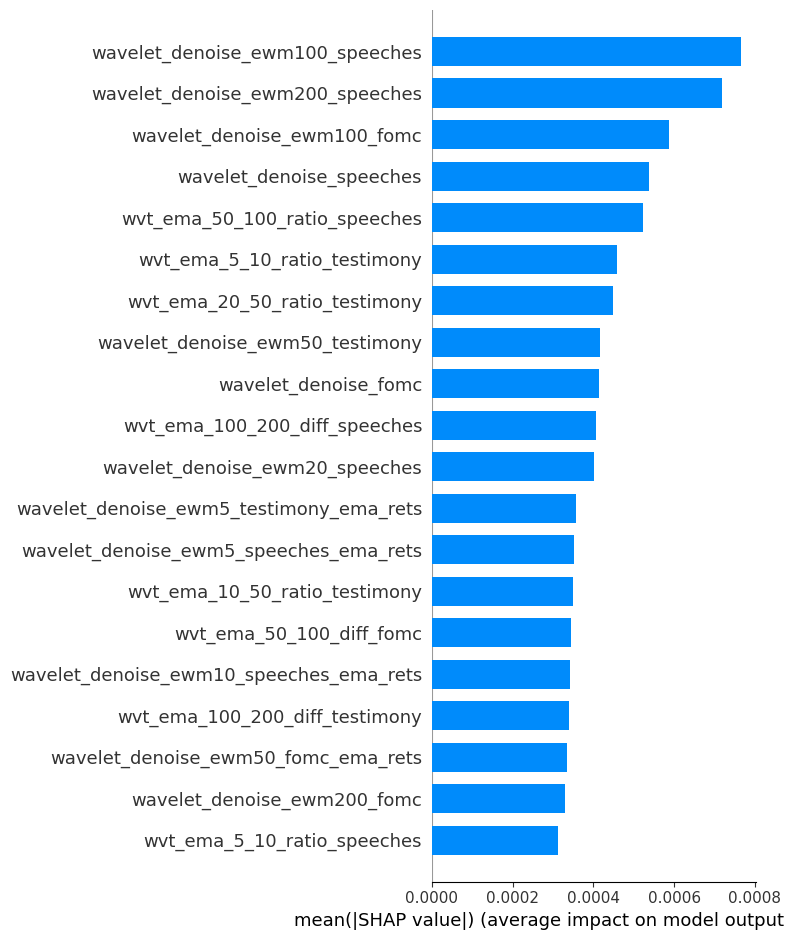

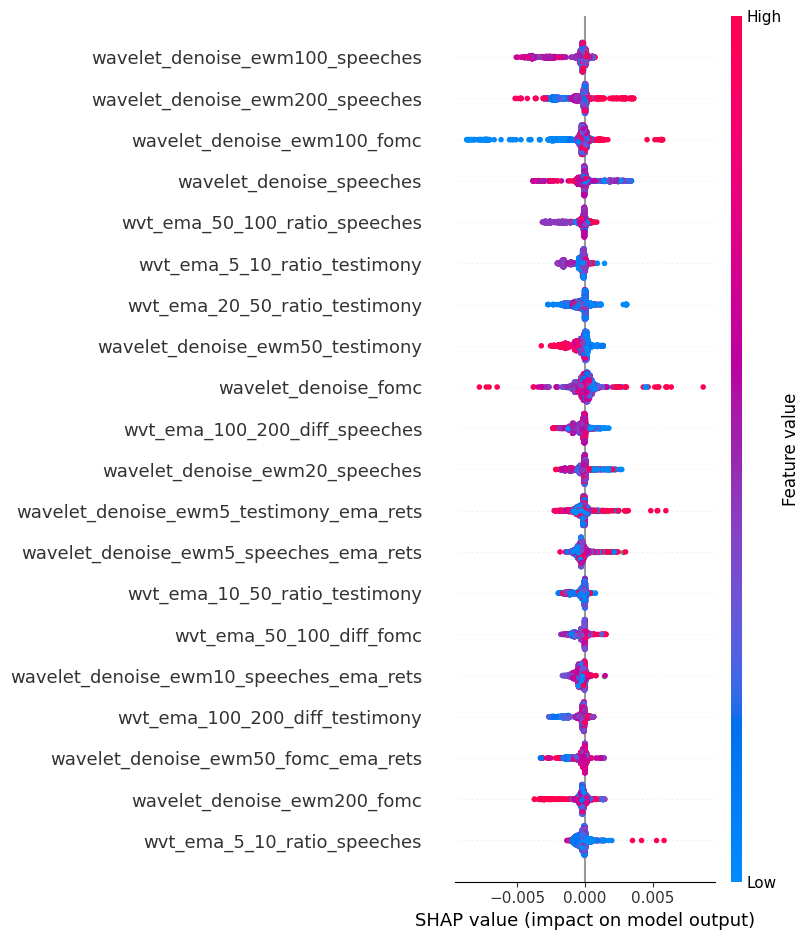

BEFORE mlflow....


2025/12/11 00:15:15 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:15:34 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:15:46 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:15:57 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:16:12 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:16:24 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs30_5b058 at: https://mlflow.mlalliance.site/#/experiments/31/runs/76a3f8b020414411b36df15964d03c00
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:16:38,709] A new study created in memory with name: no-name-85520691-c1fa-46d3-8cf6-709ebf5fd288


Running for symbol: DGS2
DGS2, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs2/trial_0/dgs2_wfcv_xgboost_model_trial_0.json +++++
DGS2, fold: 2, trial_number: 0
DGS2, fold: 3, trial_number: 0
DGS2, fold: 4, trial_number: 0
DGS2, fold: 5, trial_number: 0


[I 2025-12-11 00:18:11,480] Trial 0 finished with value: 0.46792760027762875 and parameters: {'max_depth': 8, 'learning_rate': 0.0011756060913299883, 'subsample': 0.6072049701501071, 'colsample_bytree': 0.8248046715836922, 'n_estimators': 295}. Best is trial 0 with value: 0.46792760027762875.



Best trial parameters:
  max_depth: 8
  learning_rate: 0.0011756060913299883
  subsample: 0.6072049701501071
  colsample_bytree: 0.8248046715836922
  n_estimators: 295

Best rmse_dir: 0.4679
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs2_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 samples

Processing model fold dgs2_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs2_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 samples

Processing model fold dgs2_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 553 samples

Processing model fold dgs2_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 

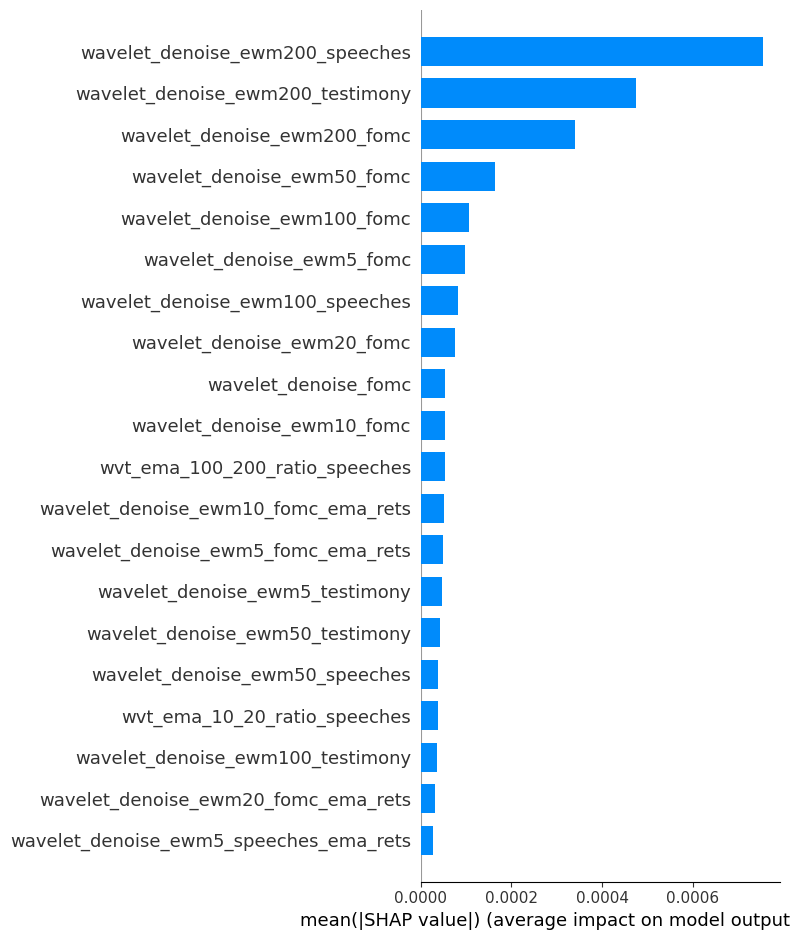

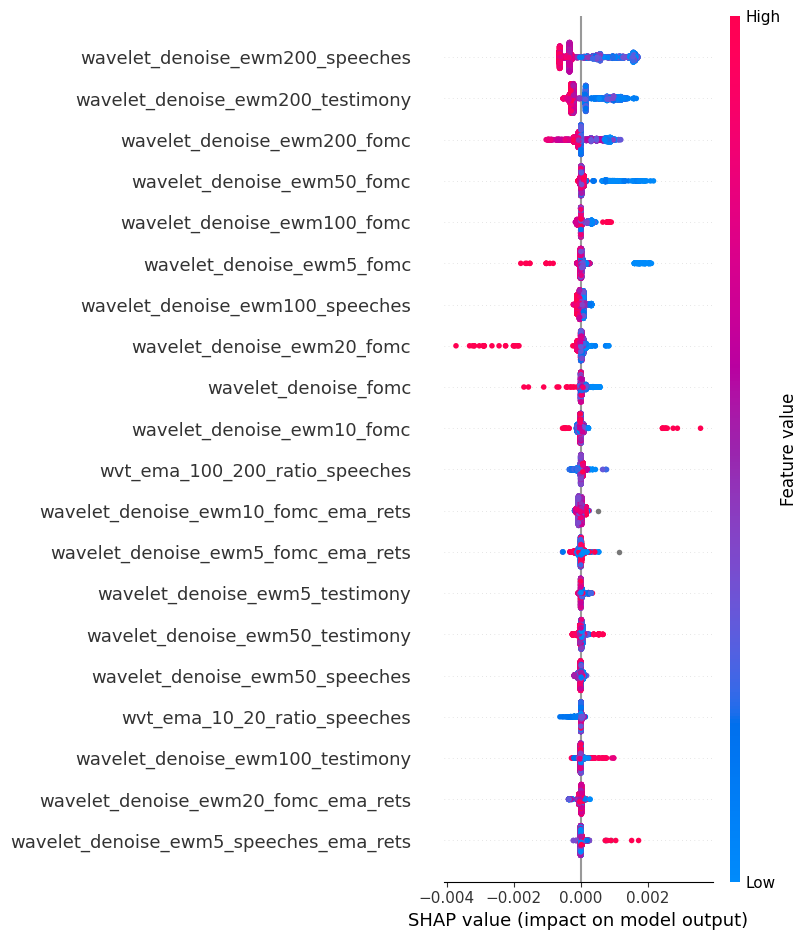

BEFORE mlflow....


2025/12/11 00:18:22 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:18:31 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:18:42 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:18:53 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:19:04 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:19:16 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs2_8ee3f at: https://mlflow.mlalliance.site/#/experiments/31/runs/4d4b0d6d3bdb4946a19e0f6cfbd2c843
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:19:30,743] A new study created in memory with name: no-name-81342cdd-95c1-4d0b-9665-830f235e26b0


Running for symbol: DGS10
DGS10, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs10/trial_0/dgs10_wfcv_xgboost_model_trial_0.json +++++
DGS10, fold: 2, trial_number: 0
DGS10, fold: 3, trial_number: 0
DGS10, fold: 4, trial_number: 0
DGS10, fold: 5, trial_number: 0


[I 2025-12-11 00:21:11,723] Trial 0 finished with value: 0.32085601553066023 and parameters: {'max_depth': 7, 'learning_rate': 0.026624287535852473, 'subsample': 0.7747332117144075, 'colsample_bytree': 0.7054481962827646, 'n_estimators': 186}. Best is trial 0 with value: 0.32085601553066023.



Best trial parameters:
  max_depth: 7
  learning_rate: 0.026624287535852473
  subsample: 0.7747332117144075
  colsample_bytree: 0.7054481962827646
  n_estimators: 186

Best rmse_dir: 0.3209
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs10_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 samples

Processing model fold dgs10_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs10_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 554 samples

Processing model fold dgs10_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs10_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 

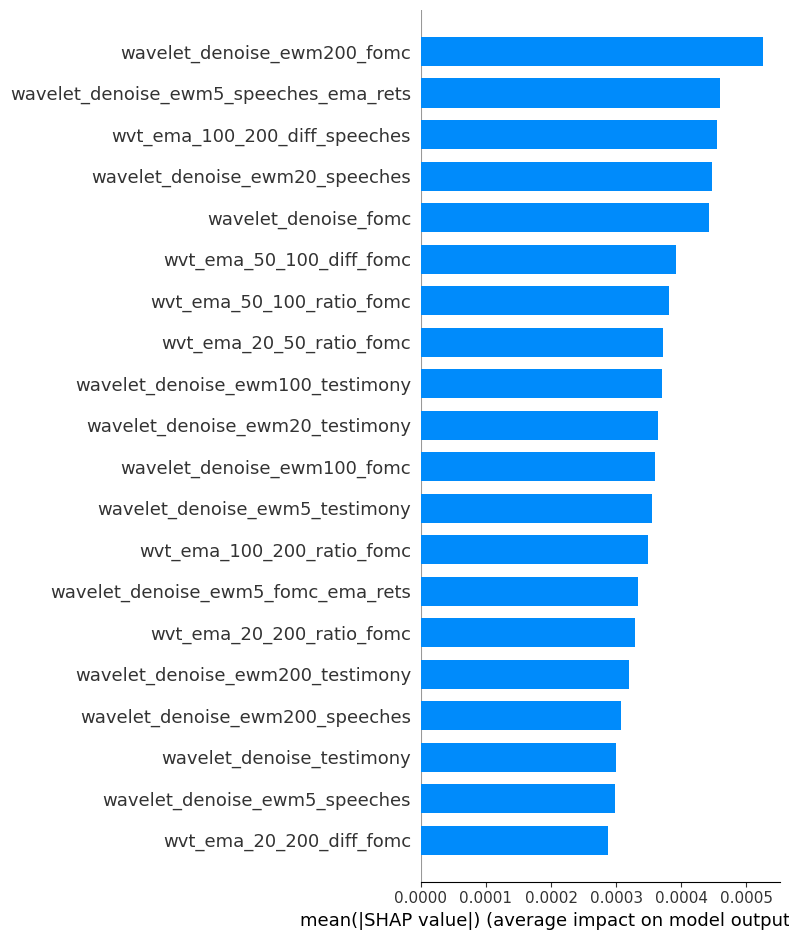

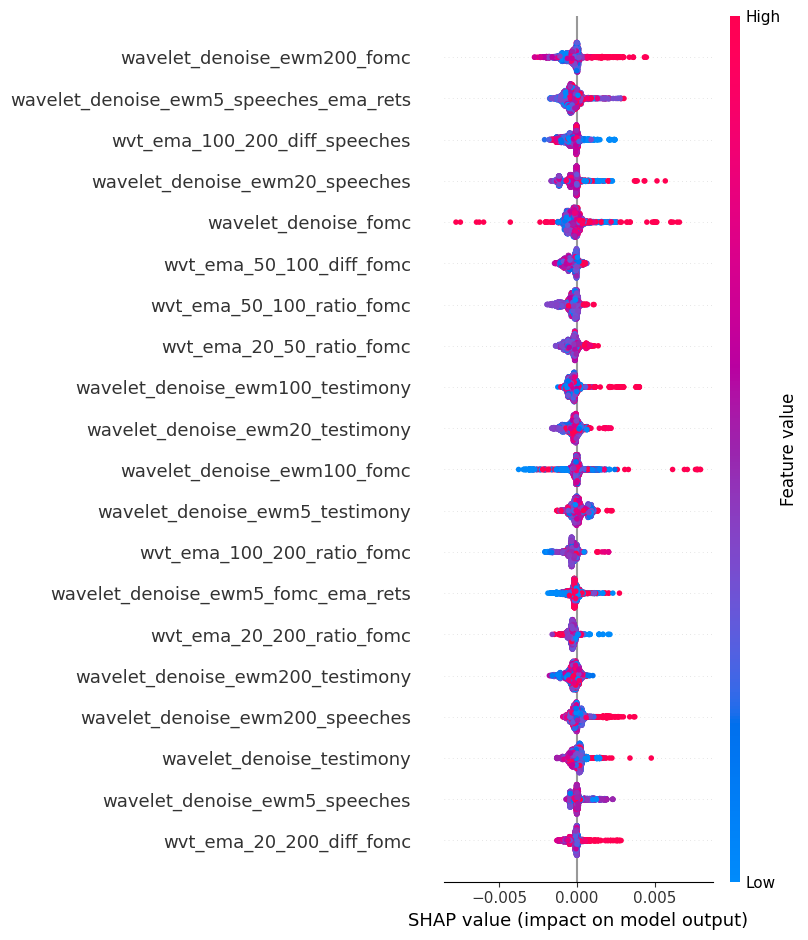

BEFORE mlflow....


2025/12/11 00:21:34 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:21:44 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:21:54 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:22:04 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:22:14 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:22:27 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs10_11998 at: https://mlflow.mlalliance.site/#/experiments/31/runs/9556bb511dcf40c89df09ea669fff3db
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:22:41,065] A new study created in memory with name: no-name-125dd74f-1f66-4619-80b8-8e512afb25c3


Running for symbol: DGS7
DGS7, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs7/trial_0/dgs7_wfcv_xgboost_model_trial_0.json +++++
DGS7, fold: 2, trial_number: 0
DGS7, fold: 3, trial_number: 0
DGS7, fold: 4, trial_number: 0
DGS7, fold: 5, trial_number: 0


[I 2025-12-11 00:25:25,722] Trial 0 finished with value: 0.3306612846089117 and parameters: {'max_depth': 6, 'learning_rate': 0.0634781901076832, 'subsample': 0.8414882204151743, 'colsample_bytree': 0.8318380200488102, 'n_estimators': 411}. Best is trial 0 with value: 0.3306612846089117.



Best trial parameters:
  max_depth: 6
  learning_rate: 0.0634781901076832
  subsample: 0.8414882204151743
  colsample_bytree: 0.8318380200488102
  n_estimators: 411

Best rmse_dir: 0.3307
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs7_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 554 samples

Processing model fold dgs7_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs7_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 samples

Processing model fold dgs7_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs7_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 sam

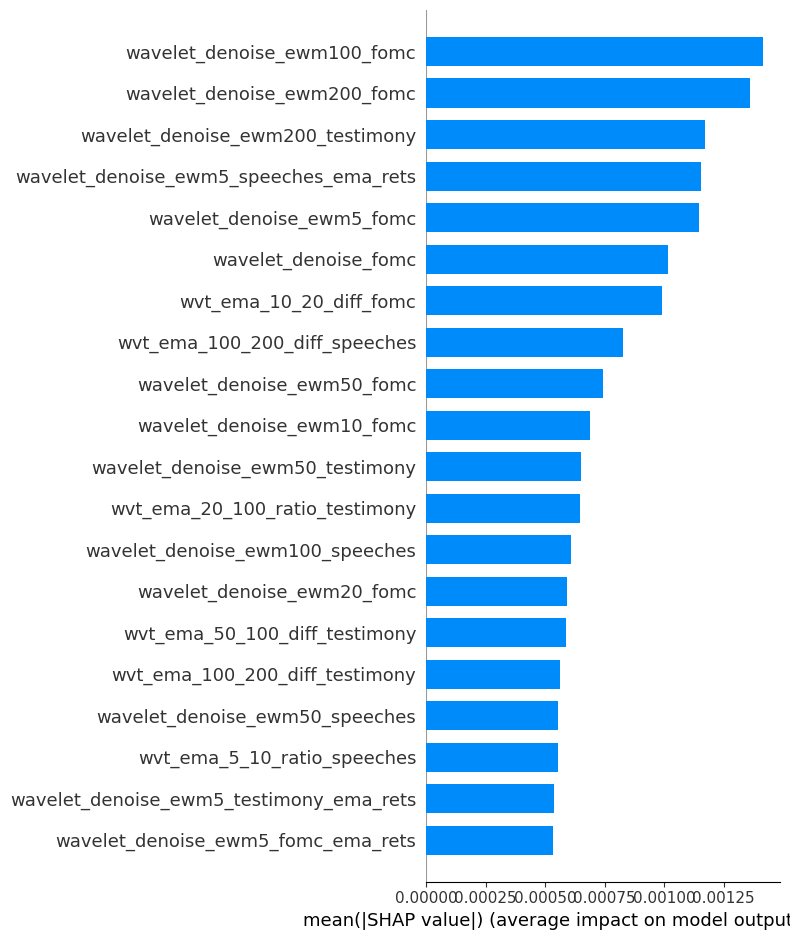

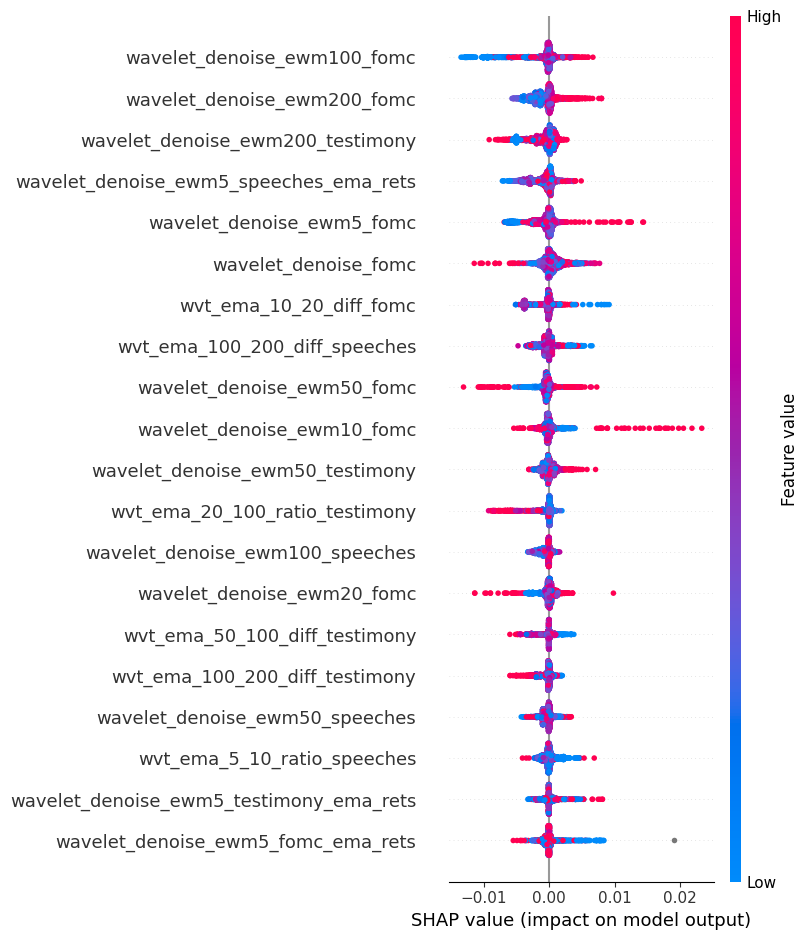

BEFORE mlflow....


2025/12/11 00:25:57 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:26:09 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:26:21 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:26:34 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:26:46 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:26:58 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs7_1cf5a at: https://mlflow.mlalliance.site/#/experiments/31/runs/f3fd15eb27e64be787913cbcd58688d7
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:27:11,517] A new study created in memory with name: no-name-ad1b5e48-ef00-4ee5-9faf-b0ef645f4376


Running for symbol: DGS6MO
DGS6MO, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs6mo/trial_0/dgs6mo_wfcv_xgboost_model_trial_0.json +++++
DGS6MO, fold: 2, trial_number: 0
DGS6MO, fold: 3, trial_number: 0
DGS6MO, fold: 4, trial_number: 0
DGS6MO, fold: 5, trial_number: 0


[I 2025-12-11 00:30:58,426] Trial 0 finished with value: 0.30358915379556345 and parameters: {'max_depth': 10, 'learning_rate': 0.05386486462951911, 'subsample': 0.9934771014229388, 'colsample_bytree': 0.8034810322165695, 'n_estimators': 181}. Best is trial 0 with value: 0.30358915379556345.



Best trial parameters:
  max_depth: 10
  learning_rate: 0.05386486462951911
  subsample: 0.9934771014229388
  colsample_bytree: 0.8034810322165695
  n_estimators: 181

Best rmse_dir: 0.3036
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs6mo_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 samples

Processing model fold dgs6mo_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 554 samples

Processing model fold dgs6mo_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs6mo_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs6mo_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 comple

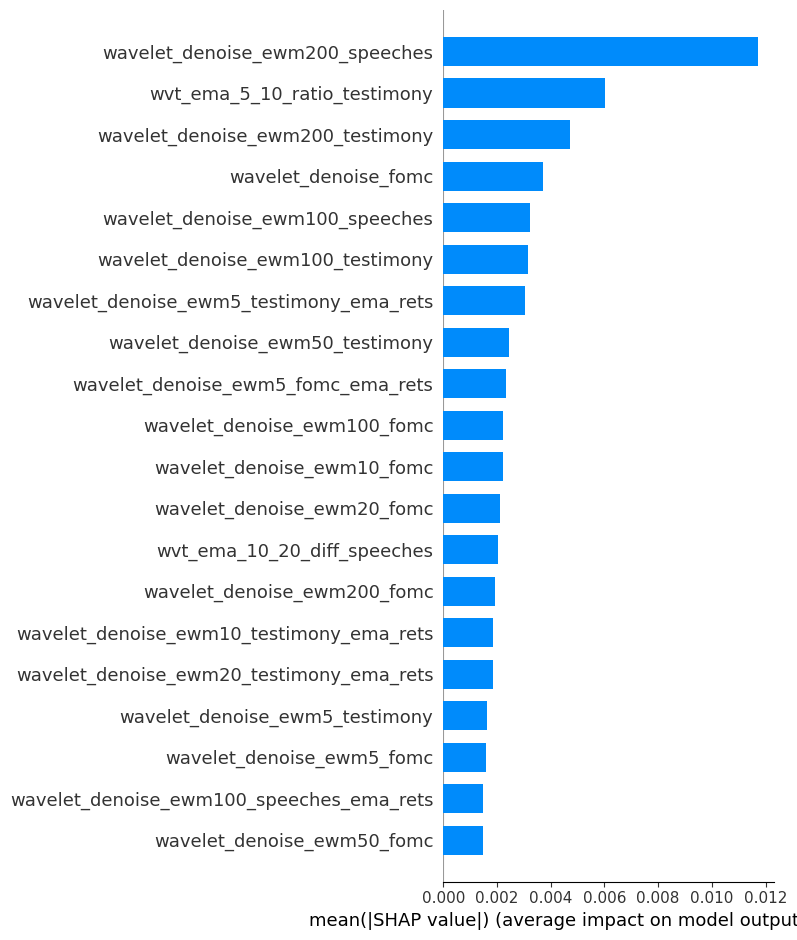

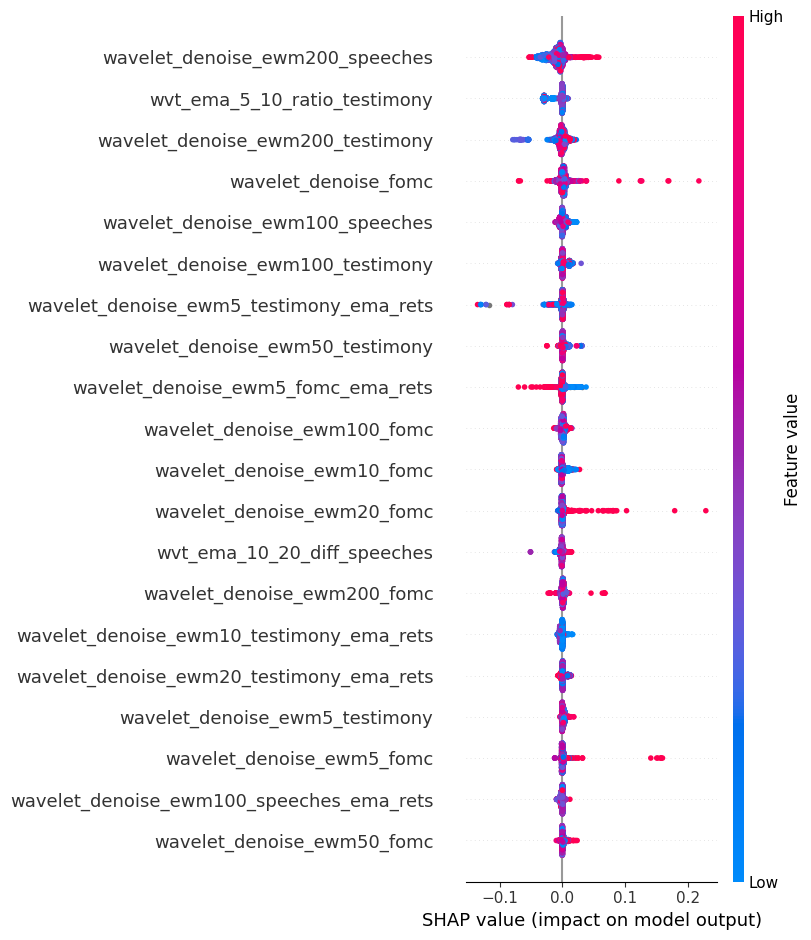

BEFORE mlflow....


2025/12/11 00:31:53 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:32:06 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:32:19 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:32:32 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:32:43 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:32:57 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs6mo_03555 at: https://mlflow.mlalliance.site/#/experiments/31/runs/b08fb8e296c846b780a7b935d0465740
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:33:11,154] A new study created in memory with name: no-name-97cabd17-7c12-4d74-8078-d70cd2b16053


Running for symbol: DGS1
DGS1, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs1/trial_0/dgs1_wfcv_xgboost_model_trial_0.json +++++
DGS1, fold: 2, trial_number: 0
DGS1, fold: 3, trial_number: 0
DGS1, fold: 4, trial_number: 0
DGS1, fold: 5, trial_number: 0


[I 2025-12-11 00:47:58,827] Trial 0 finished with value: 0.2886969228342077 and parameters: {'max_depth': 10, 'learning_rate': 0.008737549648033137, 'subsample': 0.8231758385235812, 'colsample_bytree': 0.9559035715162821, 'n_estimators': 596}. Best is trial 0 with value: 0.2886969228342077.



Best trial parameters:
  max_depth: 10
  learning_rate: 0.008737549648033137
  subsample: 0.8231758385235812
  colsample_bytree: 0.9559035715162821
  n_estimators: 596

Best rmse_dir: 0.2887
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs1_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 553 samples

Processing model fold dgs1_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs1_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 samples

Processing model fold dgs1_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs1_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 

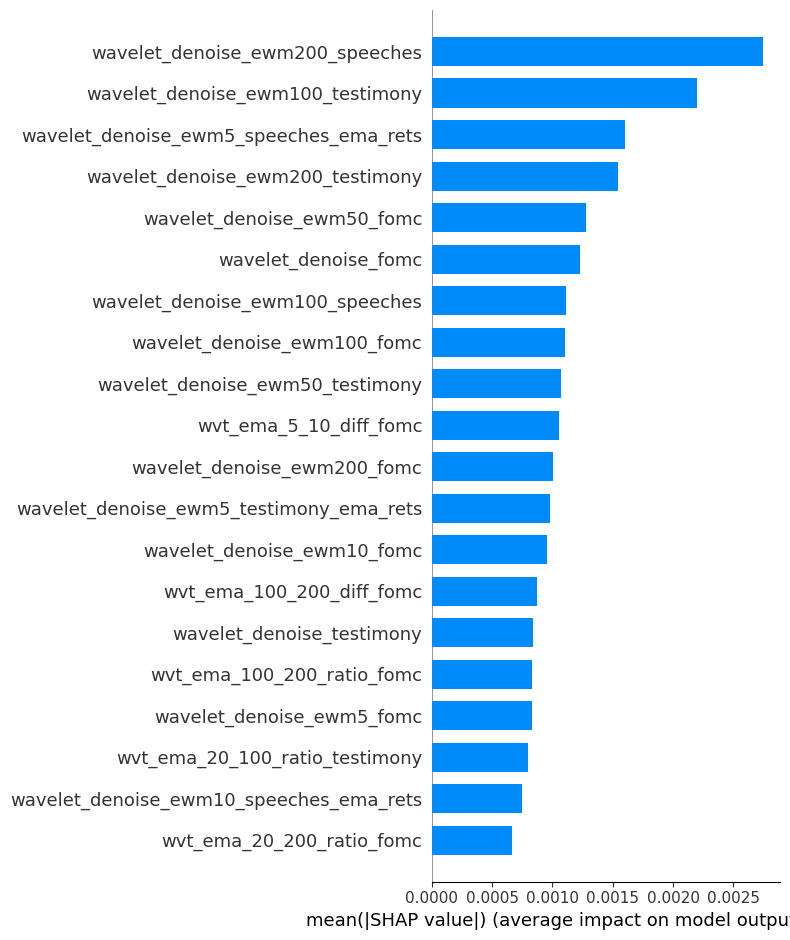

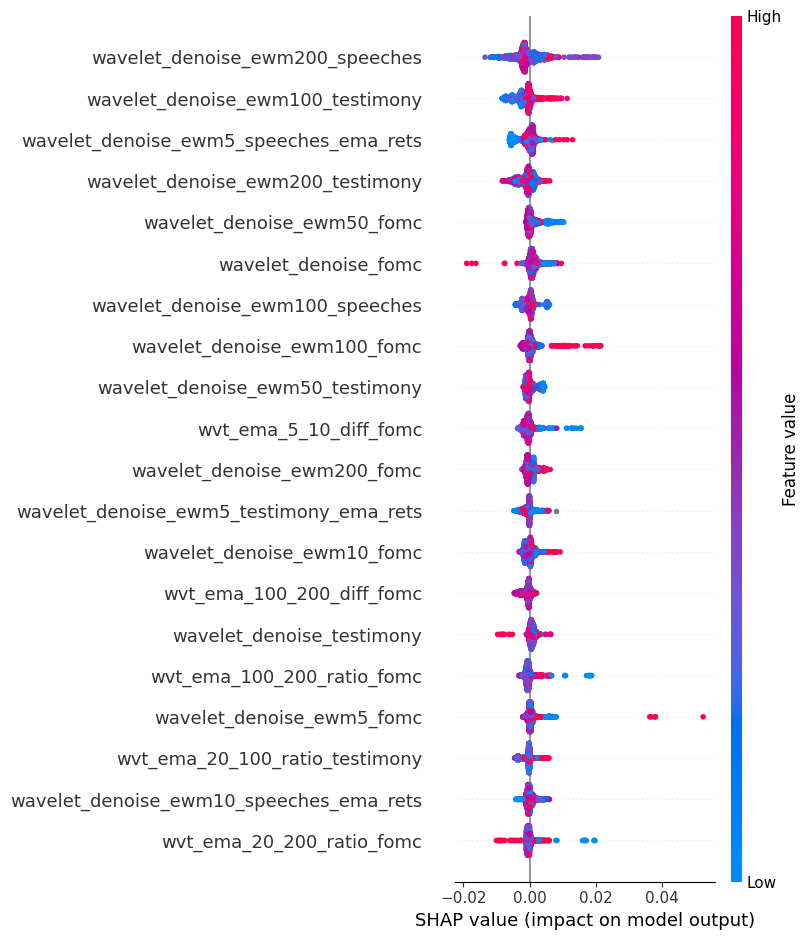

BEFORE mlflow....


2025/12/11 00:50:52 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:51:05 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:51:19 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:51:31 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:51:43 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:51:58 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs1_cf497 at: https://mlflow.mlalliance.site/#/experiments/31/runs/40497819cbb74a87849d87c0a2d15732
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:52:14,317] A new study created in memory with name: no-name-9645d92d-7692-4579-bfdb-5953ea986d11


Running for symbol: DGS5
DGS5, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs5/trial_0/dgs5_wfcv_xgboost_model_trial_0.json +++++
DGS5, fold: 2, trial_number: 0
DGS5, fold: 3, trial_number: 0
DGS5, fold: 4, trial_number: 0
DGS5, fold: 5, trial_number: 0


[I 2025-12-11 00:55:51,209] Trial 0 finished with value: 0.33252862123781207 and parameters: {'max_depth': 7, 'learning_rate': 0.03089968871174221, 'subsample': 0.9998819643784368, 'colsample_bytree': 0.8054294770630532, 'n_estimators': 385}. Best is trial 0 with value: 0.33252862123781207.



Best trial parameters:
  max_depth: 7
  learning_rate: 0.03089968871174221
  subsample: 0.9998819643784368
  colsample_bytree: 0.8054294770630532
  n_estimators: 385

Best rmse_dir: 0.3325
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs5_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 554 samples

Processing model fold dgs5_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs5_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 samples

Processing model fold dgs5_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs5_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 sa

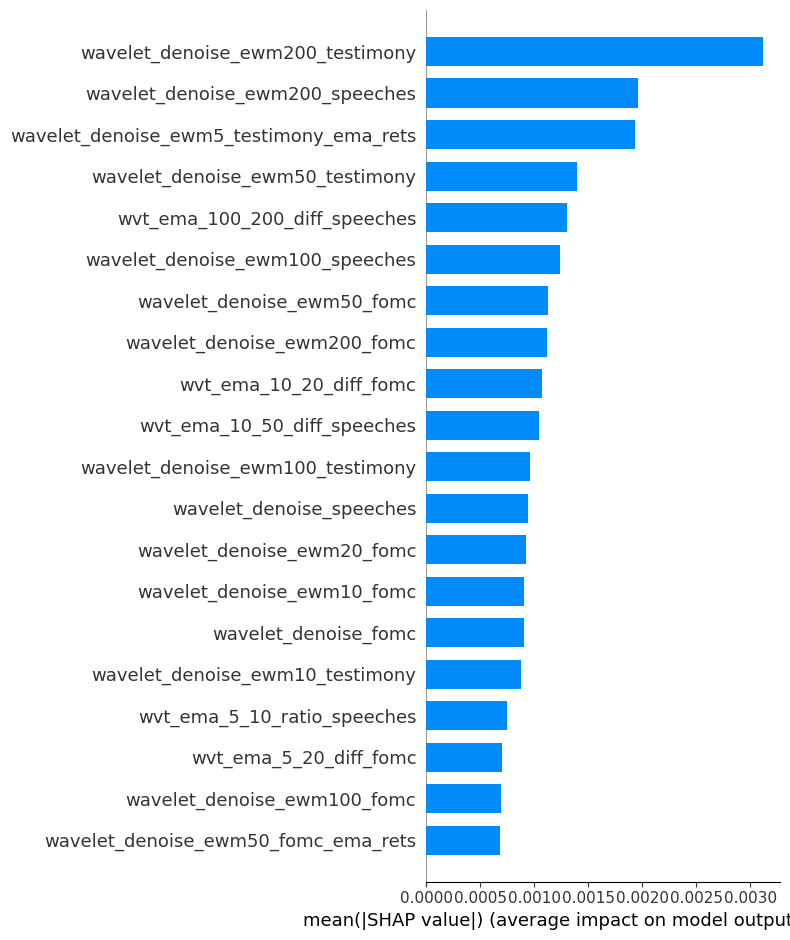

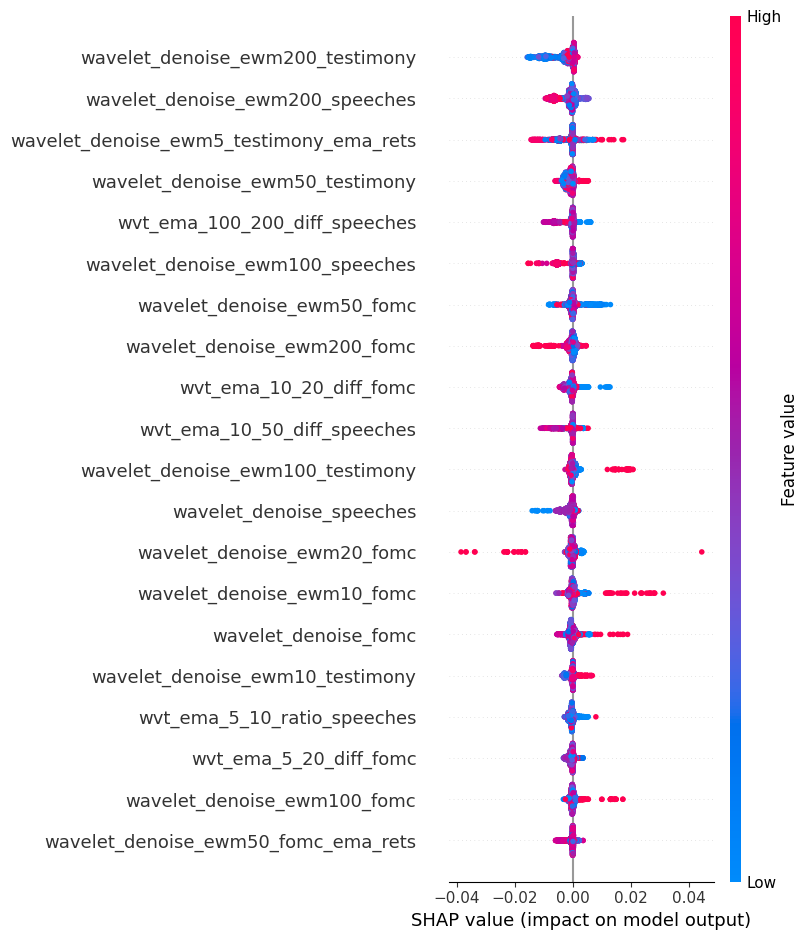

BEFORE mlflow....


2025/12/11 00:56:28 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:56:39 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:56:48 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:57:01 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:57:14 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 00:57:25 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs5_b6eb0 at: https://mlflow.mlalliance.site/#/experiments/31/runs/348a8b33ccb24c9f8f236aeb85800b5a
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 00:57:39,192] A new study created in memory with name: no-name-5c7bd26c-e61b-4968-bdab-3dadb9d4ba52


Running for symbol: DGS3
DGS3, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs3/trial_0/dgs3_wfcv_xgboost_model_trial_0.json +++++
DGS3, fold: 2, trial_number: 0
DGS3, fold: 3, trial_number: 0
DGS3, fold: 4, trial_number: 0
DGS3, fold: 5, trial_number: 0


[I 2025-12-11 01:02:52,604] Trial 0 finished with value: 0.31607038305711854 and parameters: {'max_depth': 8, 'learning_rate': 0.027695292247858206, 'subsample': 0.7000914203534134, 'colsample_bytree': 0.9207108053119096, 'n_estimators': 387}. Best is trial 0 with value: 0.31607038305711854.



Best trial parameters:
  max_depth: 8
  learning_rate: 0.027695292247858206
  subsample: 0.7000914203534134
  colsample_bytree: 0.9207108053119096
  n_estimators: 387

Best rmse_dir: 0.3161
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs3_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs3_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 samples

Processing model fold dgs3_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 553 samples

Processing model fold dgs3_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs3_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 555 s

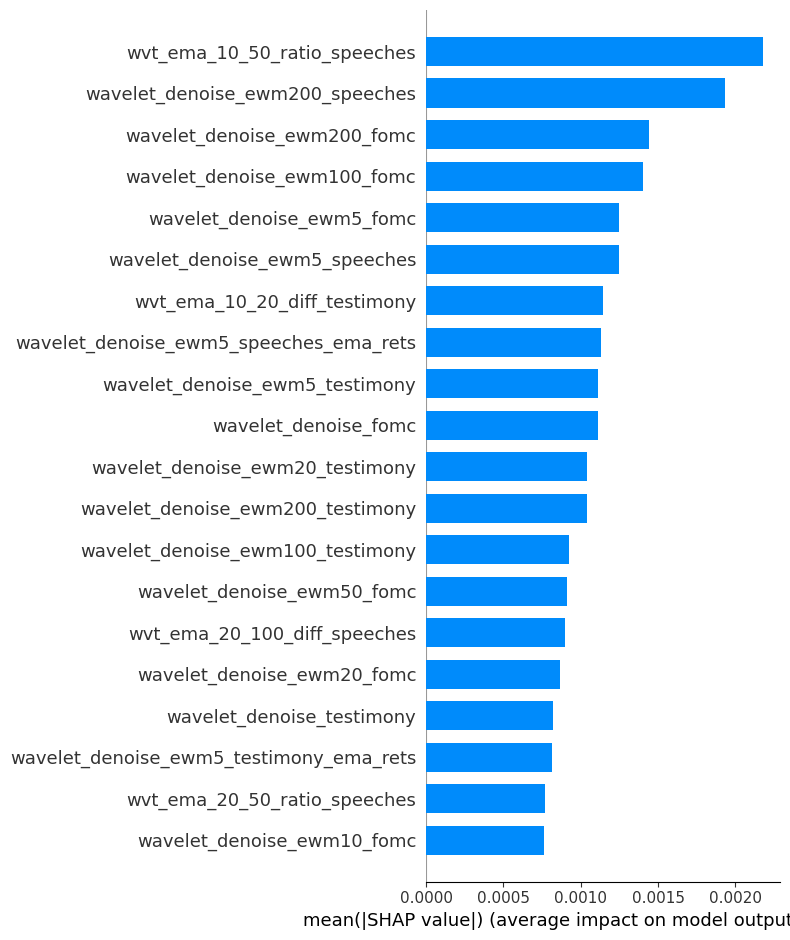

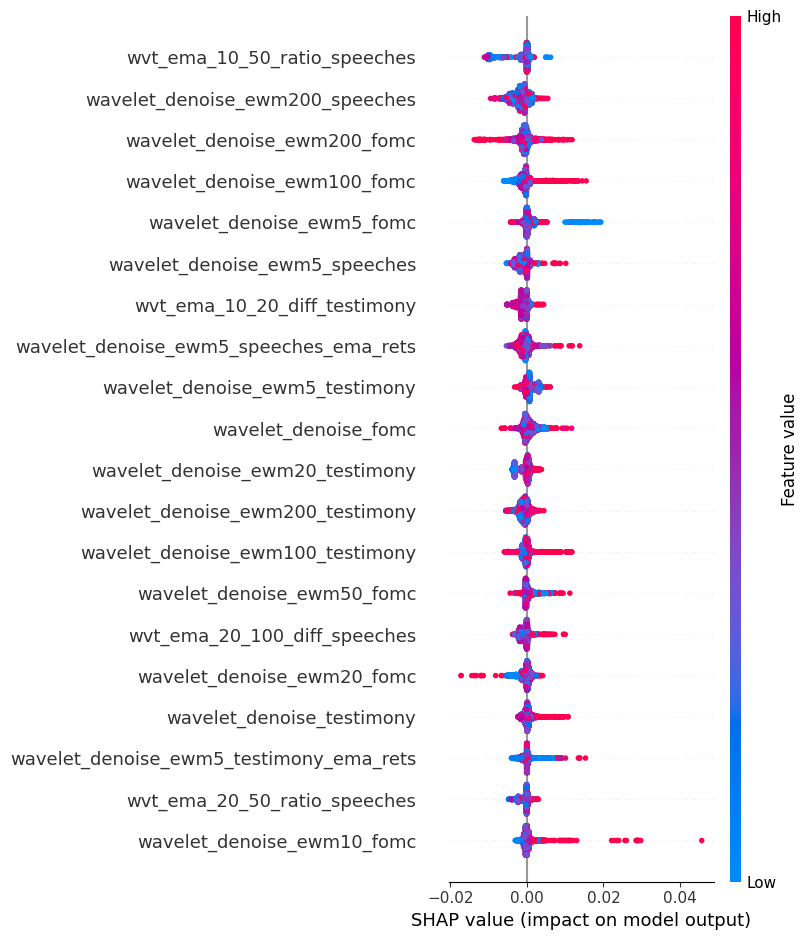

BEFORE mlflow....


2025/12/11 01:03:56 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:04:08 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:04:22 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:04:35 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:04:47 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:04:59 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs3_7e265 at: https://mlflow.mlalliance.site/#/experiments/31/runs/b7c87214be0740109daf5e39d53685b2
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


[I 2025-12-11 01:05:14,591] A new study created in memory with name: no-name-a5769fe2-5e1e-43a6-accb-eab2c2c97a75


Running for symbol: DGS20
DGS20, fold: 1, trial_number: 0
++++ SAVING PROD MODEL /content/prod_models/dgs20/trial_0/dgs20_wfcv_xgboost_model_trial_0.json +++++
DGS20, fold: 2, trial_number: 0
DGS20, fold: 3, trial_number: 0
DGS20, fold: 4, trial_number: 0
DGS20, fold: 5, trial_number: 0


[I 2025-12-11 01:08:09,922] Trial 0 finished with value: 0.33102852047229037 and parameters: {'max_depth': 9, 'learning_rate': 0.017452789630515973, 'subsample': 0.7472421476013529, 'colsample_bytree': 0.973139002460592, 'n_estimators': 195}. Best is trial 0 with value: 0.33102852047229037.



Best trial parameters:
  max_depth: 9
  learning_rate: 0.017452789630515973
  subsample: 0.7472421476013529
  colsample_bytree: 0.973139002460592
  n_estimators: 195

Best rmse_dir: 0.3310
Best trial number: 0

Loading fold data and calculating SHAP values for each fold...


Processing model fold dgs20_shap_wfcv_xgboost_model_trial_0_fold2.json...
  Calculating SHAP values for fold 2...
  Fold 2 complete - 555 samples

Processing model fold dgs20_shap_wfcv_xgboost_model_trial_0_fold4.json...
  Calculating SHAP values for fold 4...
  Fold 4 complete - 555 samples

Processing model fold dgs20_shap_wfcv_xgboost_model_trial_0_fold3.json...
  Calculating SHAP values for fold 3...
  Fold 3 complete - 555 samples

Processing model fold dgs20_shap_wfcv_xgboost_model_trial_0_fold5.json...
  Calculating SHAP values for fold 5...
  Fold 5 complete - 554 samples

Processing model fold dgs20_shap_wfcv_xgboost_model_trial_0_fold1.json...
  Calculating SHAP values for fold 1...
  Fold 1 complete - 5

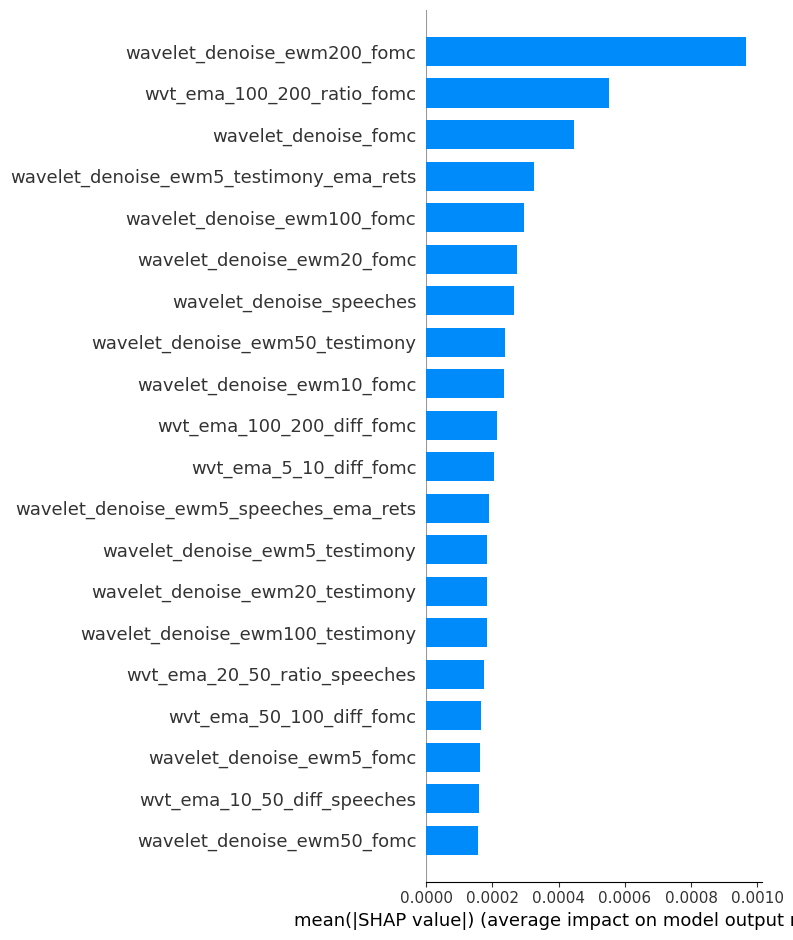

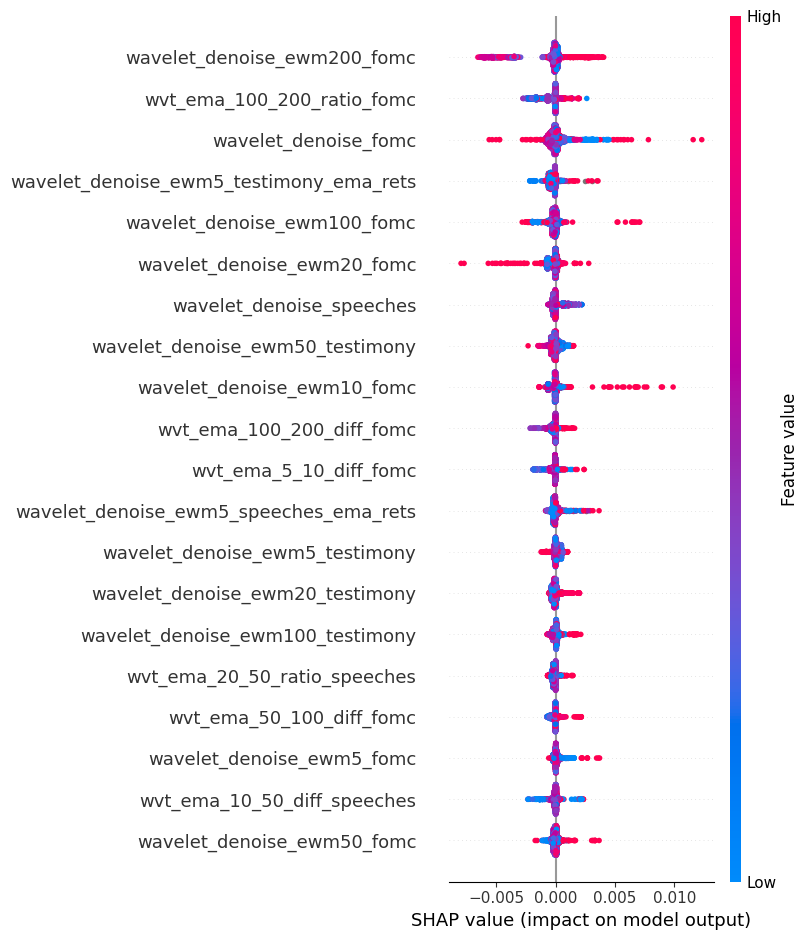

BEFORE mlflow....


2025/12/11 01:08:35 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:08:47 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:09:00 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:09:12 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:09:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/11 01:09:40 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.


🏃 View run us-treas-sentiment-feature-imporantance-III-dgs20_be9d2 at: https://mlflow.mlalliance.site/#/experiments/31/runs/5cd41bbfce374037819c2c91c566e4ed
🧪 View experiment at: https://mlflow.mlalliance.site/#/experiments/31


In [ ]:
if RUN_TRAINING_FOR_SHAP:
    # Clean up
    !rm -r /content/prod_models
    !rm -r /content/shap
    !rm -r {shap_multifold_images_folder}

    if globals().get('score_types') is None:
      score_types = ['fomc', 'testimony', 'speeches']

    shap_values_dir = (
        f"{base_path}/shap_values001_{unique_folder_id}"
    )

    os.makedirs(shap_values_dir, exist_ok=True)
    os.makedirs(shap_multifold_images_folder, exist_ok=True)

    NUM_TRIALS = 1
    METRIC     = "rmse_dir"
    OFFSET     = 1

    for symbol in list(set(index_symbols)):
        try:
            print(f"Running for symbol: {symbol}")

            train_test_df = training_df
            in_study = optimize(
                train_test_df,
                metric=METRIC,
                symbol=symbol,
                n_trials=NUM_TRIALS
            )

            (
                study, aggregated_shap_explanation, feature_names,
                aggregated_X_test, explainer, expected_value,
                best_trial_shap_folder, best_shap_data_folder,
                best_trial_num
            ) = run_shap(
                study=in_study,
                symbol=symbol,
                shap_main_model_folder=shap_main_model_folder,
                shap_main_data_folder=shap_main_data_folder
            )

            agg_shap_values = aggregated_shap_explanation.values
            agg_shap_data = aggregated_shap_explanation.data
            agg_shap_feature_names = aggregated_shap_explanation.feature_names

            shap_values_df = pd.DataFrame(
                agg_shap_values, columns=agg_shap_feature_names
            )

            shap_values_df.to_parquet(
                f"{shap_values_dir}/shap_values_{symbol}_offset_{OFFSET}.parquet"
            )

            shap.summary_plot(
                agg_shap_values,
                agg_shap_data,
                plot_type="bar",
                feature_names=agg_shap_feature_names,
                show=False,
                title=f"SHAP - {symbol} FED. Sentiment"
            )
            plt.tight_layout()
            plt.savefig(
                f"{shap_multifold_images_folder}/"
                f"shap_summary_plot_{symbol}_offset_{OFFSET}.png",
                dpi=300, bbox_inches="tight"
            )
            plt.close()

            shap.violin_plot(
                agg_shap_values,
                title=f"SHAP - {symbol} FED Sentiment",
                feature_names=agg_shap_feature_names,
                show=False
            )
            plt.tight_layout()
            plt.savefig(
                f"{shap_multifold_images_folder}/"
                f"shap_violin_plot_{symbol}_offset_{OFFSET}.png",
                dpi=300, bbox_inches="tight"
            )
            plt.close()

            local_features_path = (
                f"{base_path}/feature_data"
            )

            print("BEFORE mlflow....")
            try:
                mlflow.end_run()
            except:
                pass

            mlflow.set_tracking_uri(aws_session.public_url)

            unq_id = str(uuid.uuid4())[0:5]
            with mlflow.start_run(
                run_name=(
                    f"us-treas-sentiment-feature-imporantance-III-"
                    f"{symbol.lower()}_{unq_id}"
                )
            ) as run:
                mlflow.log_params(study.best_params)
                mlflow.log_params({
                    "optuna_num_trials": NUM_TRIALS,
                    "xgb_early_stopping": 10,
                    "cv_method": "walk_forward_plus_gap",
                    "train_size": 0.6,
                    "gap_size": "dynamic",
                    "x_y_offset": OFFSET,
                    "loss_fn": XgbMseDir.loss_fn,
                    "directional_loss_factor": LAMBDA_DIR
                })
                mlflow.log_metric(METRIC, study.best_value)

                shap_trial_data_folder = (
                    f"{shap_main_data_folder}/{symbol.lower()}/"
                    f"trial{best_trial_num}"
                )
                adf_data = pd.read_parquet(
                    f"{shap_trial_data_folder}/{symbol.lower()}_"
                    f"adf_results_trial_{best_trial_num}.parquet"
                )
                mlflow.log_artifact(
                    f"{shap_trial_data_folder}/{symbol.lower()}_"
                    f"adf_results_trial_{best_trial_num}.parquet"
                )

                # Make up a reasonable scalar value for y like 1.25
                if type(aggregated_X_test) in [pd.DataFrame, pd.Series]:
                    sig_X = aggregated_X_test.iloc[0]
                else:
                    sig_X = aggregated_X_test[0]
                signature = mlflow.models.infer_signature(sig_X, 1.25)

                # Saving only the best model for better performance
                for model_path in os.listdir(best_trial_shap_folder):
                    fold_num = re.search(r"fold(\d+)", model_path).group(1)
                    model = XGBRegressor()
                    model.load_model(
                        f"{best_trial_shap_folder}/{model_path}"
                    )
                    mlflow.xgboost.log_model(
                        model,
                        f"xgboost-regressor-wfcv-fold_{fold_num}",
                        signature=signature
                    )

                # Saving the ProdModel
                prod_model_path = (
                    f"/content/prod_models/{symbol.lower()}/"
                    f"trial_{best_trial_num}"
                )

                prod_model = XGBRegressor()
                prod_model.load_model(
                    f"{prod_model_path}/{symbol.lower()}_wfcv_xgboost_"
                    f"model_trial_{best_trial_num}.json"
                )
                mlflow.xgboost.log_model(
                    prod_model,
                    "xgboost-regressor-continually-trained",
                    signature=signature
                )

        except Exception as e:
            print(f"Outer error: {e}")

## Overall SHAP Feature Importance

In [ ]:
index_symbols = [
    "DGS6MO", "DGS1", "DGS2", "DGS3", "DGS5",
    "DGS7", "DGS10", "DGS20", "DGS30"
]

### Aggregate SHAP Values Across All DGS Symbols

In [ ]:
values_path = shap_values_dir

all_dfs = pd.DataFrame()
all_features_min_max = pd.DataFrame()

for i, symbol in enumerate(index_symbols):
    df = pd.read_parquet(
        f"{values_path}/shap_values_{symbol}_offset_1.parquet"
    )
    # Scale the scores to account for different scales
    df = (df - df.mean()) / df.std()
    # Use the absolute value of the scaled shap values
    df = df.abs()
    # Concat all values for all DGS Curves
    all_dfs = pd.concat([all_dfs, df], axis=0)
    del df

print("Number of Features Examined:", len(all_dfs.columns))

Number of Features Examined: 93


In [ ]:
assert (
    len(all_dfs.columns) == len(set(list(all_dfs.columns)))
), "Concatenated non-matching columns"

assert (
    len(all_features_min_max.columns) ==
    len(set(list(all_features_min_max.columns)))
), "Concatenated non-matching columns - MinMax"

### Extract Top Features

In [ ]:
feature_aggs = all_dfs.mean().sort_values(ascending=False)
top_features = feature_aggs[feature_aggs > feature_aggs.quantile(0.9)]
top_features

,0
wavelet_denoise_ewm200_testimony,0.749632
wavelet_denoise_ewm200_speeches,0.730470
wavelet_denoise_ewm100_speeches,0.707315
wvt_ema_100_200_ratio_speeches,0.703185
wavelet_denoise_ewm50_testimony,0.694403
wavelet_denoise_ewm5_testimony,0.690905
wvt_ema_100_200_ratio_testimony,0.674231
wavelet_denoise_ewm10_testimony_ema_rets,0.670335
wavelet_denoise_ewm20_testimony_ema_rets,0.670273
wavelet_denoise_ewm20_testimony,0.666385


In [ ]:
top_features.reset_index()

,index,0
0,wavelet_denoise_ewm200_testimony,0.749632
1,wavelet_denoise_ewm200_speeches,0.730470
2,wavelet_denoise_ewm100_speeches,0.707315
3,wvt_ema_100_200_ratio_speeches,0.703185
4,wavelet_denoise_ewm50_testimony,0.694403
5,wavelet_denoise_ewm5_testimony,0.690905
6,wvt_ema_100_200_ratio_testimony,0.674231
7,wavelet_denoise_ewm10_testimony_ema_rets,0.670335
8,wavelet_denoise_ewm20_testimony_ema_rets,0.670273
9,wavelet_denoise_ewm20_testimony,0.666385


In [ ]:
top_features_df = top_features.reset_index()
top_features_df.columns = ["feature", "mean_abs_scaled_shap_value"]
top_features_df

,feature,mean_abs_scaled_shap_value
0,wavelet_denoise_ewm200_testimony,0.749632
1,wavelet_denoise_ewm200_speeches,0.730470
2,wavelet_denoise_ewm100_speeches,0.707315
3,wvt_ema_100_200_ratio_speeches,0.703185
4,wavelet_denoise_ewm50_testimony,0.694403
5,wavelet_denoise_ewm5_testimony,0.690905
6,wvt_ema_100_200_ratio_testimony,0.674231
7,wavelet_denoise_ewm10_testimony_ema_rets,0.670335
8,wavelet_denoise_ewm20_testimony_ema_rets,0.670273
9,wavelet_denoise_ewm20_testimony,0.666385


### Visualize Top Features

**Note:** These featurues may differ from the features in the Capstone Project.
A seperate file will be provided with the SHAP Values for those results.

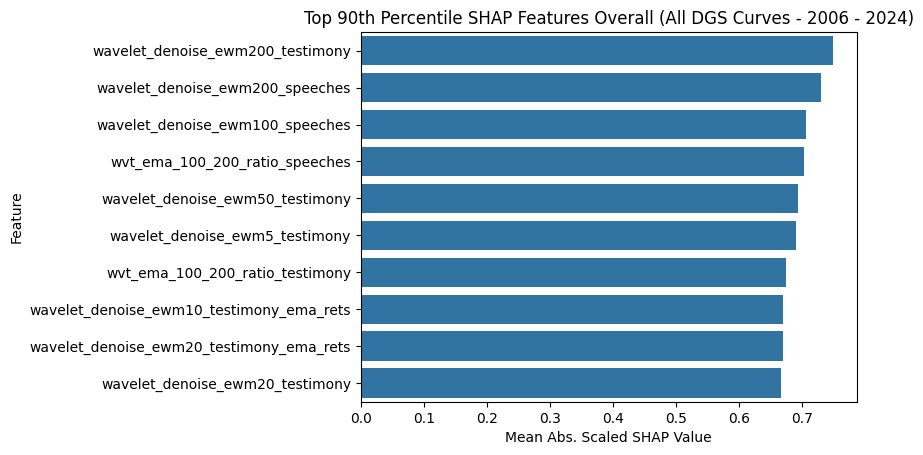

In [ ]:
sns.barplot(
    x="mean_abs_scaled_shap_value",
    y=top_features_df["feature"],
    data=top_features_df
)
plt.title("Top 90th Percentile SHAP Features Overall (All DGS Curves - 2006 - 2024)")
plt.xlabel("Mean Abs. Scaled SHAP Value")
plt.ylabel("Feature")
plt.savefig(f"{shap_multifold_images_folder}/aggeragated_shap_all_dgs.png")
plt.show()

### Save Top Features

In [ ]:
SAVE_TO_FEATURE_COLS = True

if SAVE_TO_FEATURE_COLS:
    pd.DataFrame(
        top_features, columns=["mean_abs_scaled_shap_value"]
    ).to_parquet(
        f"{base_path}/top_SHAP_features_ALL_DGS_mean_abs_scaled_values_{unique_folder_id}.parquet"
    )
else:
    top_features = pd.read_parquet(
        f"{base_path}/top_SHAP_features_ALL_DGS_mean_abs_scaled_values{unique_folder_id}.parquet"
    )

## Using Saved Feature Files

Do the Wavelet Transform on the Train/Test Split Separately

In [ ]:
training_df.head(3)

,DGS6MO,DGS1,DGS2,DGS3,DGS5,DGS7,DGS10,DGS20,DGS30,mean_sentiment_ema_fomc,mean_sentiment_ema_testimony,mean_sentiment_ema_speeches
2006-01-01,4.37,4.38,4.41,4.37,4.35,4.36,4.39,4.61,4.51,0.0,0.0,0.0
2006-01-02,4.37,4.38,4.41,4.37,4.35,4.36,4.39,4.61,4.51,0.0,0.0,0.0
2006-01-03,4.40,4.38,4.34,4.30,4.30,4.32,4.37,4.62,4.52,0.0,0.0,0.0


## Train/Test Split Example

In [ ]:
# Set Appropriate Train/Test Split (example - change accordingly)
train_start, train_end, test_start, test_end = (
    training_df.index[0],
    pd.to_datetime("2020-12-31", format=("%Y-%m-%d")),
    pd.to_datetime("2021-04-01", format=("%Y-%m-%d")),
    pd.to_datetime("2024-12-31", format=("%Y-%m-%d"))
)

X_train = training_df.loc[train_start:train_end]
X_test = training_df.loc[test_start:test_end]

X_train = X_train.drop(
    columns=[c for c in X_train.columns if "mean_sentiment" not in c]
)
X_test = X_test.drop(
    columns=[c for c in X_test.columns if "mean_sentiment" not in c]
)

## Apply Wavelet Transform

In [ ]:
remove_mean_columns = True
use_expanding = True

# Fit wavelet parameters on TRAINING data only
wavelet_params = wavelet_data_fit(X_train, score_types)

# Transform both train and test using SAME parameters from training
X_train = wavelet_data_transform(X_train, score_types, wavelet_params)

if use_expanding:
    X_test = wavelet_data_transform_expanding(
        X_test, score_types, wavelet_params
    )
else:
    X_test = wavelet_data_transform(X_test, score_types, wavelet_params)

X_train = wavelet_features(X_train)
X_test = wavelet_features(X_test)

if remove_mean_columns:
    # Remove the original mean columns
    X_train = X_train.drop(
        columns=[c for c in X_train.columns if "mean_sentiment" in c]
    )
    X_test = X_test.drop(
        columns=[c for c in X_test.columns if "mean_sentiment" in c]
    )

## Select Top Features and Analyze Correlation

In [ ]:
# Limit to the top features columns
top_features_train_df = X_train[top_features.index]
top_features_test_df = X_test[top_features.index]

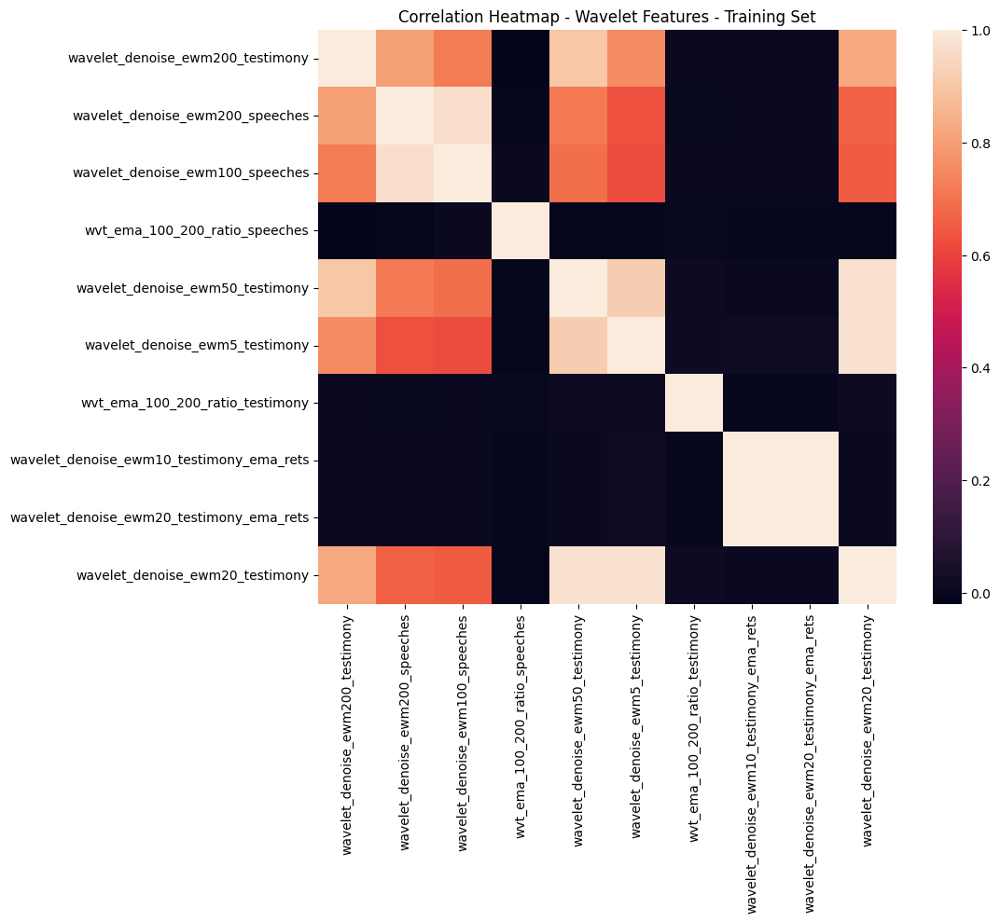

In [ ]:
# Check for highly correlated features for dimensionality reduction
scaler = StandardScaler()
top_features_std = pd.DataFrame(
    scaler.fit_transform(top_features_train_df),
    columns=top_features_train_df.columns
)
corr = top_features_std.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap="rocket")
plt.title("Correlation Heatmap - Wavelet Features - Training Set")
plt.savefig(
    f"{shap_multifold_images_folder}/aggeragated_shap_corr_all_dgs.png"
)
plt.show()

The correlation matrix here may be different from the one in the paper. This is because the models used there were highly optimized through hyperparameter tuning and so the SHAP feature attributions there may have had difference influencing characteristics from those here. However, the runs saved during the course of the Capstone project were also saved for reference. More details can be found in the Github Repository.

## Save Feature Data

In [ ]:
SAVE_TOP_FEATURES = False

if SAVE_TOP_FEATURES:
    top_features_train_df.to_parquet(
        f"{base_path}/top_features_gpt5_train_set_not_scaled_offset_by1.parquet"
    )
    top_features_test_df.to_parquet(
        f"{base_path}/top_features_gpt5_test_set_not_scaled_offset_by1.parquet"
    )
    top_features_train_df.columns